Тетрадка - вариант решения тестового задания. ТГ для связи: https://t.me/Serge_koval

## Основная часть

Использование встроенного в Open_CV функционала не дало достаточного качества, пришлось использовать внешние библиотеки. Кстати, и распознавание текста из цветного изображения проходит, на мой взгляд, получше, чем ч/б.

In [ ]:
!pip install easyocr

In [ ]:
!pip install mtcnn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 5.3 MB/s 


В качестве "якорной точки" ориентируемся на наличие фото. Другие элементы в качестве шаблона не очень подходят. Распознать "Российская Федерация" можно только после детекции, - а присутствует не всегда. Проблеммы и с номером по правому борту.

In [ ]:
# cv
import cv2
import PIL
import numpy as np
from mtcnn import MTCNN
import easyocr

# general
import os
import string
import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
CURRENT = "current.png"
letters = "".join([chr(x) for x in range(ord('а'), ord('я') + 1)]) + 'ё'
CHARS = letters + letters.upper() + string.digits + '.'
reader = easyocr.Reader(["ru"])
detector = MTCNN()


class NotFacesFoundError(Exception):
    pass

class NameNotFoundError(Exception):
    pass


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.1% Complete

In [ ]:
# здесь функции, используемые и для демо-части и для пользовательской

def save_masked(im, mask, filename=CURRENT):
    saved_img = cv2.bitwise_and(im, im, mask=mask)
    cv2.imwrite(filename, saved_img)
    return saved_img


def check_coord(c, tr_h, w_c):
    h, w, x_c = c[3][1] - c[0][1], c[1][0] - c[0][0], (c[0][0] + c[1][0]) / 2
    return (h > 0.8 * tr_h) and (w_c - 2 * w < x_c < w_c + 2 * w)


def get_text_result(textes, tr_conf=0.5):
    res = []
    tr = []  # собираем высоту боксов (ориентируемся на 3 самых высоких), центры по горизонтали

    for coord, text, confidence in textes:
        words = [word.upper() for word in text.split() if word.isalpha()]  # ["WORD_A", "WORD_B"]
        if words and confidence > tr_conf:
            tr.append((coord[3][1] - coord[0][1], (coord[0][0] + coord[1][0]) / 2))
            res.append((coord, words[0]))  # Для этого варианта только 1 слово

    if len(res) < 3:
        raise  NameNotFoundError

    tr.sort(reverse=True)
    tr_h = tr[2][0] if len(tr) > 2 else sum([h for h, x in tr[:3]]) / 3
    w = [x_c for h, x_c in tr]
    w.sort()
    w_c = sum(w[:3]) / 3

    res = [pair for pair in res if check_coord(pair[0], tr_h, w_c)]    # отбросили те, что ниже порога
    res = sorted(sorted(res, key=lambda pair: pair[0][0][0]), key=lambda pair: pair[0][0][1])   # "Y" по возрастанию ("Х" по возрастанию)

    keys = ("Фамилия", "Имя", "Отчество")
    answer = {key: val[-1] for key, val in zip(keys, res)}
    if len(answer) == 3:
        return answer
    raise NameNotFoundError


def get_faces_coord_cnn(im_colored, x_min, y_min, x_max, y_max):
    " MTCNN coord , - возвращаем 1 box"
    res = detector.detect_faces(im_colored)
    boxes = [item.get('box') for item in res]
    if boxes:
        return boxes[0]

    raise NotFacesFoundError(boxes, x_min, y_min, x_max, y_max)


def get_mask(shape, x1, y1, x2, y2):
    mask = np.zeros(shape[:2], np.uint8)
    cv2.rectangle(mask, pt1=(x1, y1), pt2=(x2, y2), color=255, thickness=-1)
    return mask


def erose_border(img, mask=True):
    corners = np.uint0(cv2.goodFeaturesToTrack(img, 20, 0.05, 200))
    x_min, y_min = img.shape
    x_max, y_max = 0, 0
    for corner in corners:
        x, y = corner.ravel()
        x_min, y_min = min(x_min, x), min(y_min, y)
        x_max, y_max = max(x_max, x), max(y_max, y)

    if mask:
        mask = get_mask(img.shape, x_min, y_min, x_max, y_max)
        img = cv2.bitwise_and(img, img, mask=mask)

    return img, (x_min, y_min, x_max, y_max)


def save_crop_text(im, x, y, w, h, filename, denoiser=None):
    # рассчет координат для окна с ФИО"
    x1, y1 = x + int(1.9 * w), y - int(1.29 * h)
    x2, y2 = x + int(7.6 * w), y + h - int(0.33 * h)
    if denoiser:
        pass
        # маскирование фото
        mask1 = get_mask(im.shape, int(x - 0.2 * w), int(y - 0.2 * h), int(x + 1.2 * w), int(y + 1.2 * h))
        im = cv2.bitwise_or(im, im, mask=mask1)
        im = denoiser(im)

    mask2 = get_mask(im.shape[:2], x1, y1, x2, y2)
    return save_masked(im, mask2, filename)


def best_ocr(temp_file):
    text = reader.readtext(temp_file,
                           decoder='beamsearch',
                           contrast_ths=0.25,
                           allowlist=CHARS,           # возможно ведет к переобучению
                           min_size=15)
    return text


def convert_image2text(image_file, temp_file=CURRENT, ocr_func=best_ocr):
    img_c = cv2.imread(image_file)
    img_c = cv2.cvtColor(img_c, cv2.COLOR_BGR2RGB)   # на цветном даже лучше не только фото искать, но и OCR отрабатывает хорошо.
    img = cv2.cvtColor(img_c, cv2.COLOR_BGR2GRAY)

    #  Определим точки внешнего контура,- не дать внешнему контуру внести смещение в denoising
    img, (x_min, y_min, x_max, y_max) = erose_border(img)

    # фотография будет служить привязкой для окна, в котором ищем ФИО
    x, y, w, h = get_faces_coord_cnn(img_c, x_min, y_min, x_max, y_max)   # NotFacesFoundError!!
    cv2.rectangle(img, (x, y), (x + w, y + h), 0, 3)

    # выделяем и сохраняем целевой сегмент
    cropp = save_crop_text(img_c, x, y, w, h, filename=temp_file, denoiser=None)

    text = ocr_func(temp_file)

    fig, ax = plt.subplots(1, 2, figsize=(18, 18))
    ax[0].imshow(img, cmap='gray', vmin=0, vmax=255)
    ax[1].imshow(cropp, cmap='gray', vmin=0, vmax=255)
    plt.show()

    return text


## Эта часть относится к боту,- раз просили API.
И поскольку цели чисто тестовые - самая простая из библиотек.

In [ ]:
!pip install pytelegrambotapi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 213 kB 5.3 MB/s 
  Created wheel for pytelegrambotapi: filename=pyTelegramBotAPI-4.7.1-py3-none-any.whl size=196987 sha256=835a44695aecec0d90bd6983748a29ce4a6404926544daa9fe91b16b1cd30466
  Stored in directory: /root/.cache/pip/wheels/84/72/5f/8a7b3ca1ef1250002cf3bac48e0c72c5ee5c9596a5b1295dc1
Successfully built pytelegrambotapi


In [ ]:
from io import BytesIO
from telebot import types
from telebot import TeleBot
import requests
from telebot import apihelper
import logging
from tele_token import  TOKEN     # файл с токеном



def store_photo_id(bot, message, image_files):
    # нужно получить  картинки, поэтому будем сохранять id  картинки в словарь
    chat_id = message.chat.id
    # получаем информацию о картинке , сохраняем photo_Id   за пользователем
    image_id = message.photo[-1].file_id
    print('Obtained file_obj = ', image_id)
    image_files[chat_id] = image_id


def save_photo(bot, image_id, file_name):
    image_file_obj = bot.get_file(image_id)
    image_file = bot.download_file(image_file_obj.file_path)

    # bytes переводим в Image и далее в тензор
    image_file = BytesIO(image_file)
    image_file.seek(0)
    image = PIL.Image.open(image_file)
    print("image_shape", image.size)
    image.save(file_name)


def main_bot():
    image_files = {}
    logging.basicConfig(
        format='%(asctime)s - %(name)s - %(levelname)s - %(message)s',
        level=logging.INFO)

    bot = TeleBot(TOKEN)
    command = "прочитать ФИО по скану"

    markup_menu = types.ReplyKeyboardMarkup(resize_keyboard=True, row_width=3)
    markup_menu.add(types.KeyboardButton(command))


    @bot.message_handler(commands=['start', 'help'])
    def send_welcome(message: types.Message):
        text = ""
        if message.text == "/start":
            text = "У бота только одна опция: прочитать ФИО по скану паспорта"
        elif message.text == "/help":
            text = "простой последовательный бот для парсинга ФИО"
        bot.send_message(message.chat.id, text, reply_markup=markup_menu)


    @bot.message_handler(content_types=['photo'])
    def photo(message):
        store_photo_id(bot, message, image_files)


    @bot.message_handler(func=lambda message: True)
    def send_welcome(message: types.Message):
        text_template = "отправьте скан паспорта, страница с текстом должна располагаться горизонтально"
        chat_id = message.chat.id
        file_name = str(chat_id) + ".png"

        if message.text == command:
            if chat_id in image_files:
                bot.send_message(chat_id,
                                     "Файл получен, обработка займет несколько минут",
                                     reply_markup=markup_menu
                                    )
                try:
                    save_photo(bot, image_files[chat_id], file_name)
                    texts = convert_image2text(file_name)
                    answer = get_text_result(texts)
                    print("OK! answer=", answer)
                    text = "\n".join([f"{key}: {val}" for key, val in answer.items()])
                    bot.send_message(chat_id,
                                     text,
                                     reply_markup=markup_menu
                                    )
                except NotFacesFoundError:
                    bot.send_message(chat_id,
                                     "Возможно это скан, и даже скан паспорта, но бот не смог его распознать\n" + text_template,
                                     reply_markup=markup_menu
                                    )
                except NameNotFoundError as e:
                    print("NameNotFoundError <> file_name, texts:", file_name, texts)
            else:
                bot.send_message(chat_id,
                                 "Сначала " + text_template,
                                 reply_markup=markup_menu
                                )
        else:
            bot.send_message(chat_id,
                                f'{message.text} -что это было???',
                                reply_markup=markup_menu
                                )

    bot.polling(none_stop=True, timeout=60)

Запускать бота здесь (раскомментировать):

In [ ]:
# main_bot()

## Демо- часть.

Пример обработки тестовых сканов. Не все читаются хорошо. В примере понизил порог уверенности до 0.3, но правильнее говорить "Не знаю" при большем пороге . Также есть сомнение в полезности allow_list - возможно достовернее было бы избежать подгонки и отбрасывать не литеральные ответы.

In [ ]:
filenames = []
for filename in sorted(os.listdir(os.getcwd())):
    if filename.endswith('.jpeg') or filename.endswith('.png'):
        filenames.append(filename)
", ".join(filenames)

'0.jpeg, 1.jpeg, 2.jpeg, 3.jpeg, 4.png, 5.jpeg, 6.jpeg, 7.jpeg, 8.jpeg, 9.jpeg'

1/1 [==============================] - 0s 36ms/step


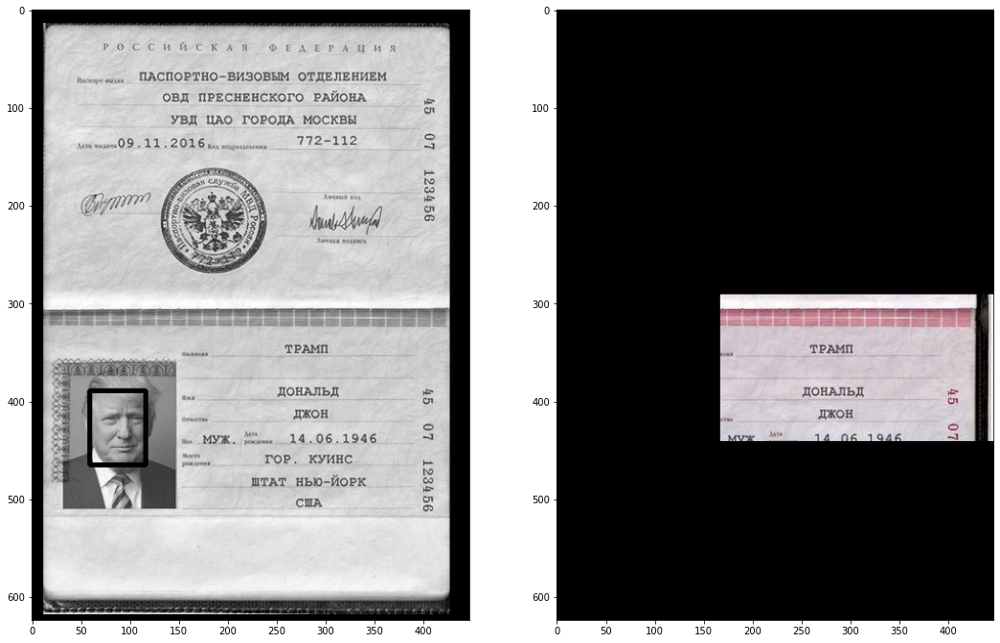

OK! answer= {'Фамилия': 'ТРАМП', 'Имя': 'ДОНАЛЬД', 'Отчество': 'ДЖОН'}
----------------------------------------
1/1 [==============================] - 0s 32ms/step


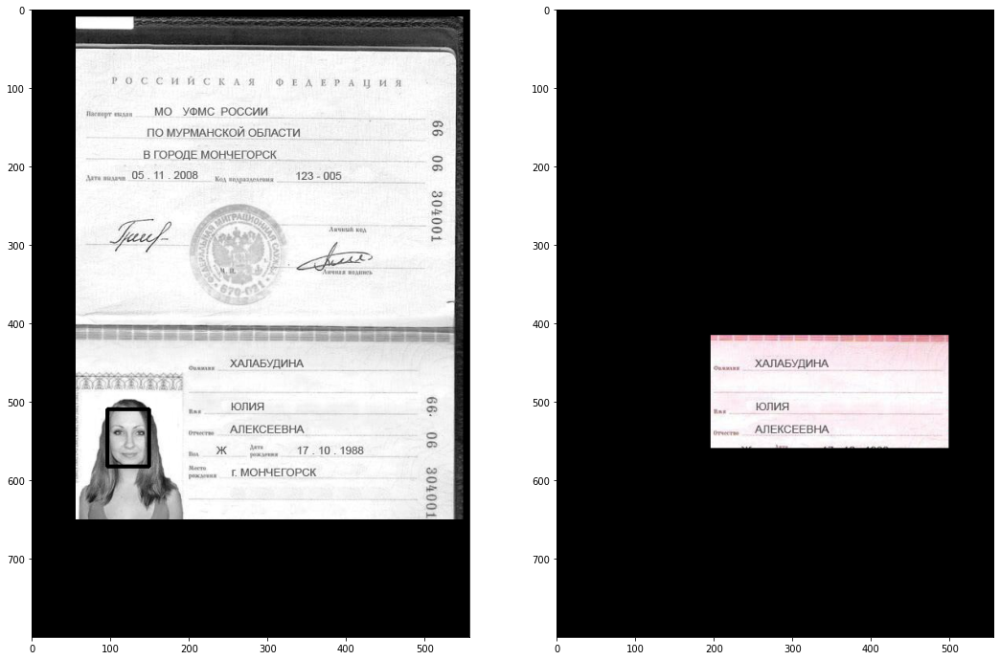

OK! answer= {'Фамилия': 'ХАЛАБУДИНА', 'Имя': 'ЮЛИЯ', 'Отчество': 'АЛЕКСЕЕВНА'}
----------------------------------------
1/1 [==============================] - 0s 35ms/step


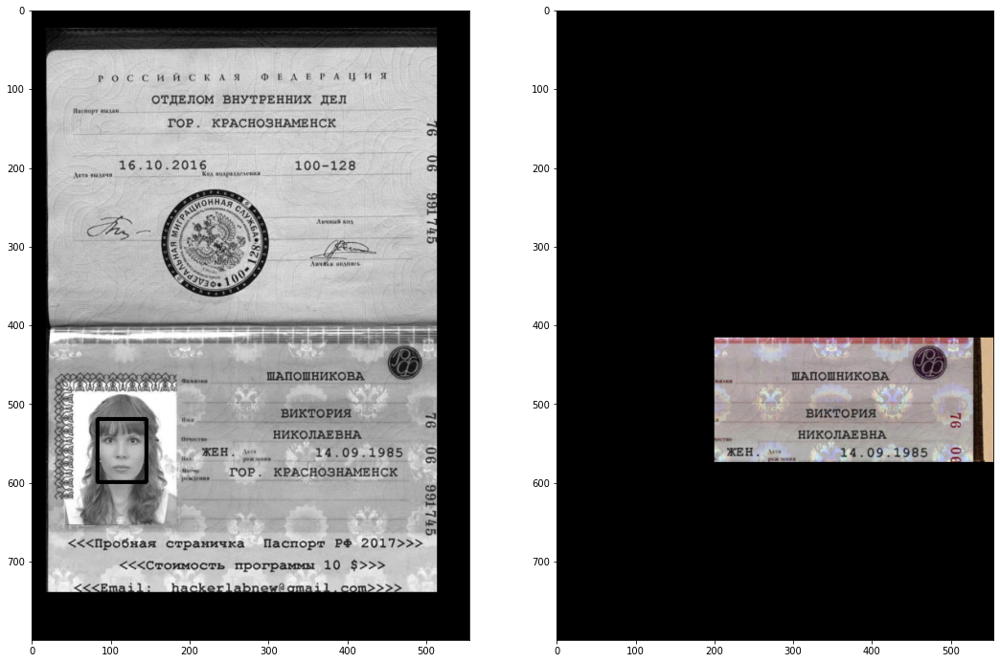

OK! answer= {'Фамилия': 'ШАПОШНИКОВА', 'Имя': 'ВИКТОРИЯ', 'Отчество': 'НИКОЛАЕВНА'}
----------------------------------------
1/1 [==============================] - 0s 29ms/step


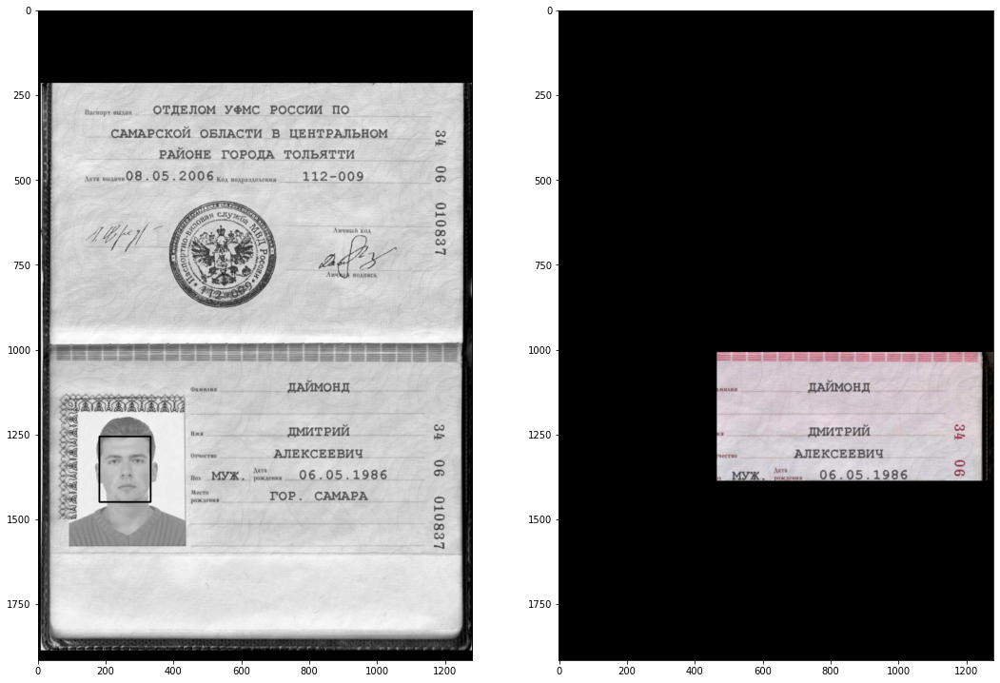

OK! answer= {'Фамилия': 'ДАЙМОНД', 'Имя': 'ДМИТРИЙ', 'Отчество': 'АЛЕКСЕЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 28ms/step


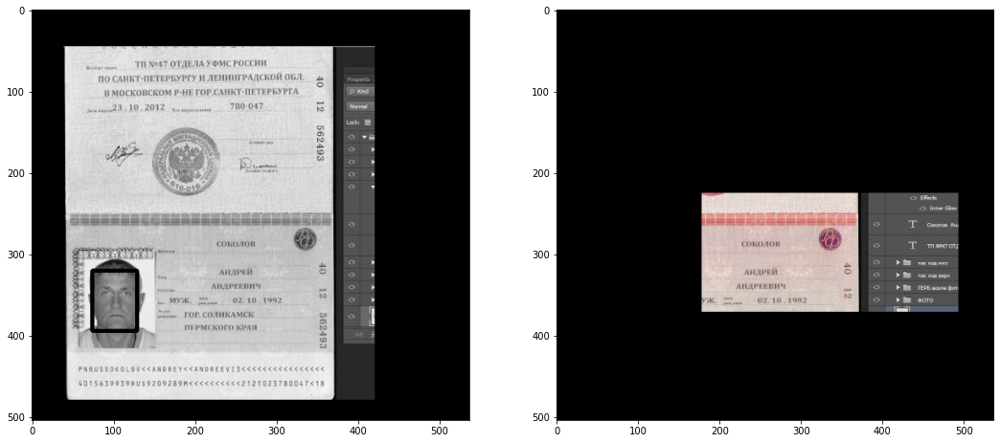

OK! answer= {'Фамилия': 'СОКОЛОВ', 'Имя': 'АНДРЕИ', 'Отчество': 'АНДРЕЕНИЧ'}
----------------------------------------
1/1 [==============================] - 0s 28ms/step


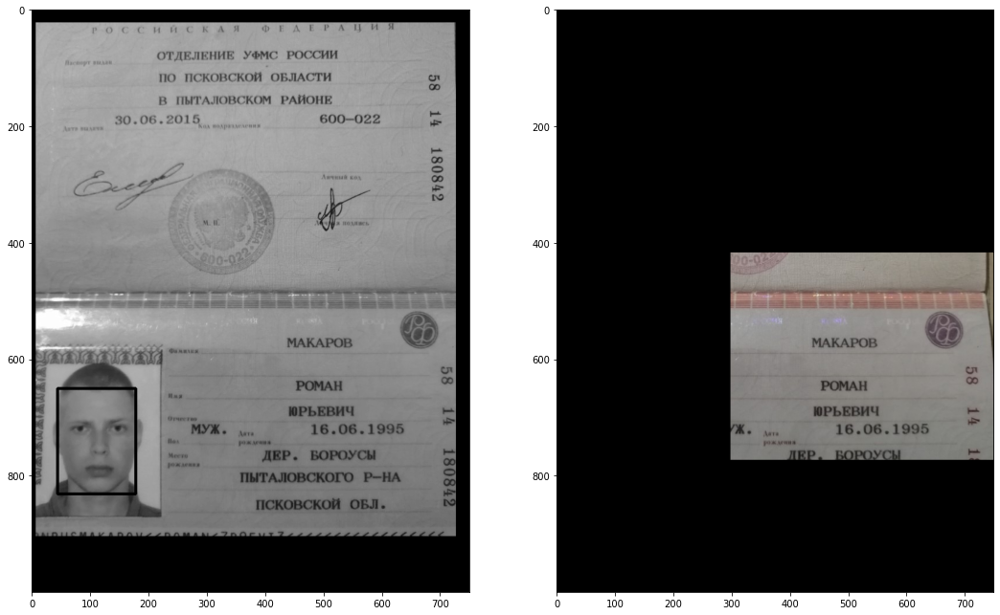

OK! answer= {'Фамилия': 'МАКАРОВ', 'Имя': 'РОМАН', 'Отчество': 'ЮРЬЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 40ms/step


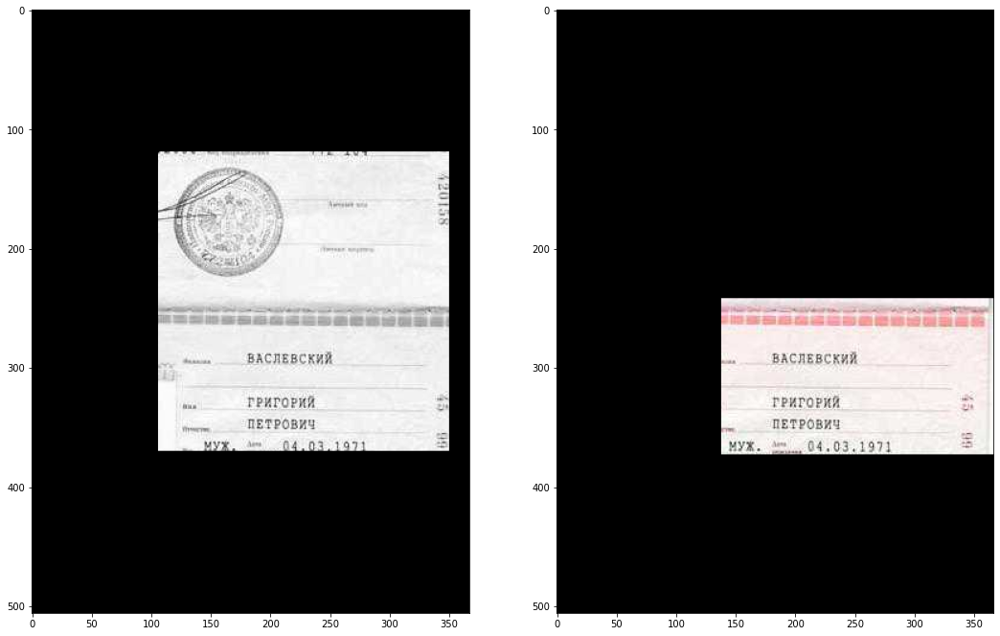

OK! answer= {'Фамилия': 'ВАСЛЕВСКИЯ', 'Имя': 'ГРКГОРЖЯ', 'Отчество': 'ПЕТРОВИЦ'}
----------------------------------------
1/1 [==============================] - 0s 49ms/step


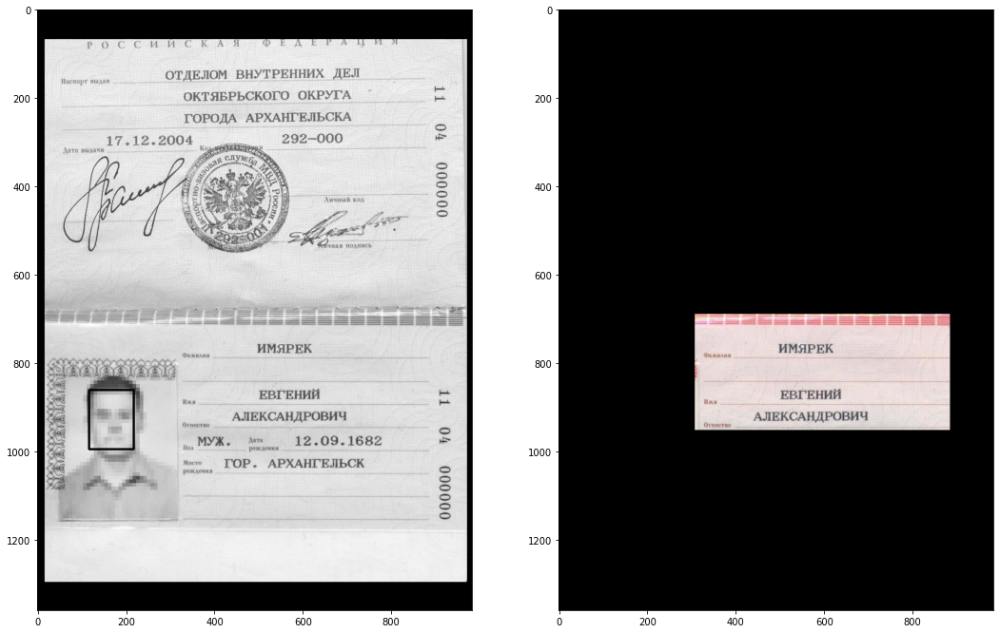

OK! answer= {'Фамилия': 'ИМЯРЕК', 'Имя': 'ЕВГЕНИЙ', 'Отчество': 'АЛЕКСАНДРОВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 37ms/step


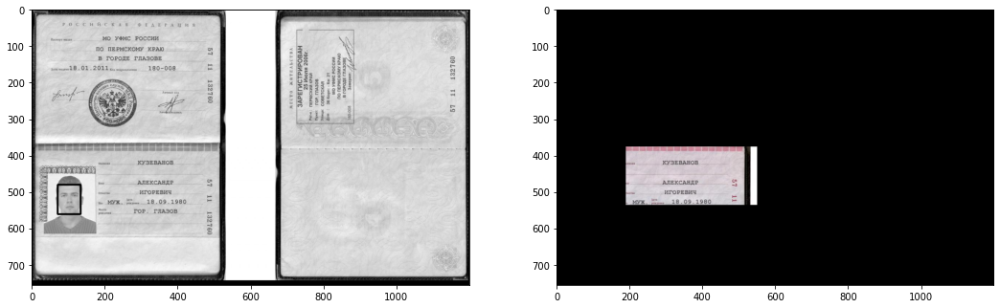

OK! answer= {'Фамилия': 'КУЗЕВАНОВ', 'Имя': 'АЛЕКСАНДР', 'Отчество': 'ИГОРЕВИЧ'}
----------------------------------------
1/1 [==============================] - 0s 58ms/step


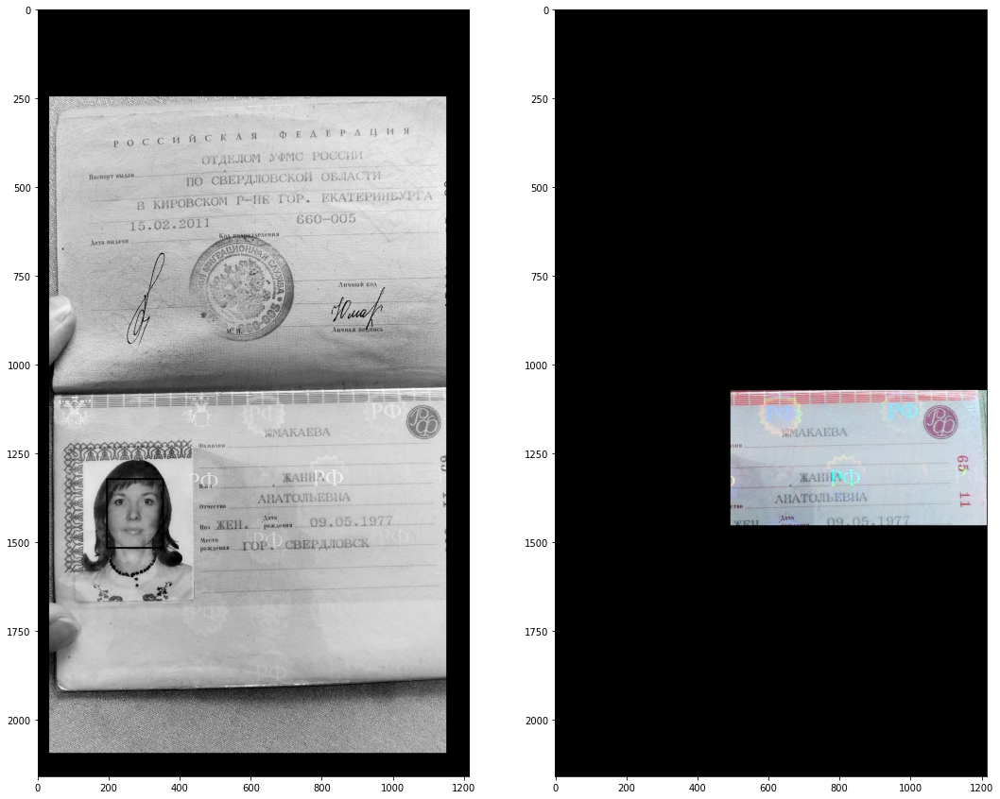

NameNotFoundError <> file_name, texts: 9.jpeg [([[589, 1109], [682, 1109], [682, 1170], [589, 1170]], '5а', 0.018480074415621446), ([[934, 1104], [1028, 1104], [1028, 1160], [934, 1160]], 'РФ', 0.9998688415268309), ([[629, 1173], [827, 1173], [827, 1209], [629, 1209]], 'ЗМАКАЕВА', 0.248599807484206), ([[497, 1223], [529, 1223], [529, 1237], [497, 1237]], 'лия', 0.9264630048042338), ([[1127, 1251], [1167, 1251], [1167, 1307], [1127, 1307]], 'с', 0.8324159104233786), ([[685, 1301], [777, 1301], [777, 1337], [685, 1337]], 'ЖАНН', 0.32086890935897827), ([[768, 1290], [866, 1290], [866, 1346], [768, 1346]], 'РРФ', 0.9841076592361885), ([[616, 1355], [883, 1355], [883, 1397], [616, 1397]], 'АНАТОЛЬЕВНА', 0.9804577381277528), ([[1135, 1353], [1173, 1353], [1173, 1407], [1135, 1407]], '6', 0.2684134907234501), ([[501, 1395], [531, 1395], [531, 1407], [501, 1407]], 'ТНО', 0.39160811318710864), ([[633, 1423], [675, 1423], [675, 1443], [633, 1443]], 'Дата', 0.9490910768508911), ([[830, 1423], [88

In [ ]:
for file_name in filenames:
    try:
        texts = convert_image2text(file_name)
        answer = get_text_result(texts, tr_conf=0.3)
        print("OK! answer=", answer)
    except NotFacesFoundError:
        print("Not found face --> aborted")
    except NameNotFoundError as e:
        print("NameNotFoundError <> file_name, texts:", file_name, texts)
    print("--" * 20)

Паспорта Васлевского, Юмакаевой и Соколова читаются плохо, с ошибками. Но порог уверенности модели в этом демонстрационном примере поставлен низким(0.3) - поэтому ошибка выскакивает только на Юмакаевой, остальные 2  прочитаны с опечатками.

## Своя модель распознавания

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
!cp  /content/gdrive/MyDrive/lines_w25.tar /content/lines_w25.tar

In [ ]:
!tar -xf /content/lines_w25.tar

In [ ]:
#model
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
from tqdm import tqdm, tqdm_notebook
from torchvision import transforms, models, datasets
from torch.utils.data import Dataset, DataLoader

# general
import cv2
import os
import string
import numpy as np
from collections import Counter
from itertools import groupby

import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
txt_files = []
png_files = []
others = []

data_dir = '/content/lines_w25/'

for file_name in os.listdir(data_dir):
    if file_name.endswith('.txt'):
        txt_files.append(file_name)
    elif file_name.endswith('.png'):
        png_files.append(file_name)
    else:
        txt_files.append(file_name)

print([len(x) for x in (txt_files, png_files, others)])
print(len(txt_files ), len(set(txt_files)))
txt_files.sort()
png_files.sort()

print(", ".join(txt_files[:10]))
print(", ".join(png_files[:10]))


[200002, 200002, 0]
200002 200002
0_a.gt.txt, 0_b.gt.txt, 100000_a.gt.txt, 100000_b.gt.txt, 10000_a.gt.txt, 10000_b.gt.txt, 10001_a.gt.txt, 10001_b.gt.txt, 10002_a.gt.txt, 10002_b.gt.txt
0_a.png, 0_b.png, 100000_a.png, 100000_b.png, 10000_a.png, 10000_b.png, 10001_a.png, 10001_b.png, 10002_a.png, 10002_b.png


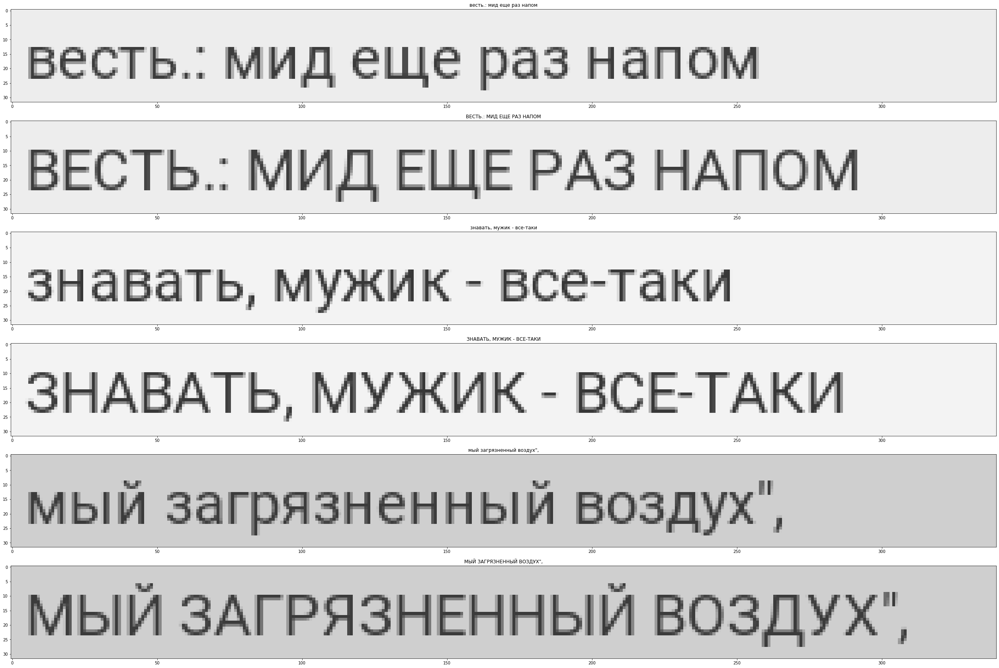

In [ ]:
n = 6
labels = []

fig, ax = plt.subplots(n, 1, figsize=(15 * n, 30))
for j in range(n):
    img = cv2.imread(f'/content/lines_w25/{png_files[j]}', 0)
    ax[j].imshow(img, cmap='gray', vmin=0, vmax=255)

    with open(f'/content/lines_w25/{txt_files[j]}') as f:
        txt = f.read().strip()
        labels.append((png_files[j], txt_files[j], img.shape, txt))
    ax[j].set_title(txt, )

plt.show()
for d in labels:
    print(d)


In [ ]:
total_chars = Counter()
uniq_lengths, uniq_shape = {}, {}
equal_begin = 0
# MEAN = 0
# STD = 0

zero_lengths = []

for j, file_name in enumerate(txt_files):
    beg = file_name.split('.')[0]
    img_name = png_files[j]
    equal_begin += img_name.startswith(beg + '.')
    # img = cv2.imread(f'/content/lines_w25/{img_name}', 0)
    # img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    # uniq_shape[img.shape] = uniq_shape.get(img.shape, 0) + 1
    # img = np.float16(img) / 255
    # MEAN += img.mean()
    # STD += img.std()

    with open(f'/content/lines_w25/{file_name}') as f:
        txt = f.read()[:-1]                                # убрать только перенос, пробелы оставить
    uniq_lengths[len(txt)] = uniq_lengths.get(len(txt), 0) + 1
    if len(txt) <= 1:
        zero_lengths.append(file_name)

#     words= txt.split()
#     total_chars.update(list(txt))

# MEAN /= len(txt_files)
# STD /= len(txt_files)

In [ ]:
# uniq_lengths = sorted(uniq_lengths.items())
# uniq_shape = sorted(uniq_shape.items())
# print("uniq_shape:", uniq_shape)
# print("uniq_lengths:", uniq_lengths)
# MEAN, STD                                                  # after binarization  0.8847897020815322, 0.32452819495337104

uniq_shape: [((32, 340), 200002)]
uniq_lengths: [(0, 854), (1, 64), (2, 74), (3, 64), (4, 96), (5, 72), (6, 60), (7, 70), (8, 60), (9, 56), (10, 74), (11, 56), (12, 78), (13, 92), (14, 66), (15, 66), (16, 68), (17, 50), (18, 64), (19, 68), (20, 98), (21, 140), (22, 260), (23, 4384), (24, 47282), (25, 145686)]


(0.8847897020815322, 0.32452819495337104)

In [ ]:
for name in zero_lengths[: 10]:
    with open(f'/content/lines_w25/{name}') as f:
        txt = f.read()[:-1]
    print(name, "text:", txt )

print(len(zero_lengths), len(set(zero_lengths)))
for name in zero_lengths:
    beg = name.split('.')[0]
    img_name = beg + ".png"

    png_files.remove(img_name)
    txt_files.remove(name)


11642_a.gt.txt text: 
11642_b.gt.txt text: 
11790_a.gt.txt text: 
11790_b.gt.txt text: 
11791_a.gt.txt text: 
11791_b.gt.txt text: 
1341_a.gt.txt text: .
1341_b.gt.txt text: .
13548_a.gt.txt text: 
13548_b.gt.txt text: 
918 918


In [ ]:
# print(len(total_shars), equal_begin / len(txt_files))
# uniq_lengths = sorted(uniq_lengths.items())
# uniq_shape = sorted(uniq_shape.items())
# MEAN /= len(txt_files)
# STD /= len(txt_files)
# print("uniq_shape:", uniq_shape)
# print("uniq_lengths:", uniq_lengths)
# MEAN, STD

92 1.0
uniq_shape: [((32, 340), 200002)]
uniq_lengths: [(0, 854), (1, 64), (2, 74), (3, 64), (4, 96), (5, 72), (6, 60), (7, 70), (8, 60), (9, 56), (10, 74), (11, 56), (12, 78), (13, 92), (14, 66), (15, 66), (16, 68), (17, 50), (18, 64), (19, 68), (20, 98), (21, 140), (22, 260), (23, 4384), (24, 47282), (25, 145686)]


(0.8184756311616571, 0.18888870380247613)

73142 в это, стоить однажды заг (32, 340)


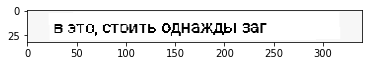

In [ ]:
def rand_dataset(j=None):
    j = j or np.random.randint(0, len(txt_files)) 
    with open(f'/content/lines_w25/{txt_files[j]}') as f:
        txt = f.read().strip()

    img = cv2.imread(f'/content/lines_w25/{png_files[j]}', 0)
    bg = img[-3:, :].mean()
    img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    img = transforms.ToPILImage()(img)
    img = transforms.RandomAffine(5, scale=(0.8, 1.1), fill=bg)(img)
    img = transforms.ToTensor()(img).numpy()

    img = img.squeeze(0)
    plt.imshow(img, cmap='gray')
    print(j, txt, img.shape)


rand_dataset(j=73142) #                   j = 164031

Dataloader

In [ ]:
IMG_H, IMG_W = (32, 340)
MEAN_IMG = 0.8848 
STD_IMG = 0.3245
CHARS = list(' !"()*,-.0123456789:;<>?[]ЁАБВГДЕЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯабвгдежзийклмнопрстуфхцчшщъыьэюяё')
N_CLASSES = len(CHARS) + 1
BLANK = 0

DEVICE = torch.device('cuda') if torch.cuda.is_available() else 'cpu'
if not torch.cuda.is_available():
    print("А где же ГПУ?")

''.join(CHARS)

А где же ГПУ?


' !"()*,-.0123456789:;<>?[]ЁАБВГДЕЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯабвгдежзийклмнопрстуфхцчшщъыьэюяё'

In [ ]:
class ImgTextData(Dataset):
    def __init__(self, text_files, img_files, ind_labels, text_size=25, mode='val'):
        super().__init__()
        self.img_files = img_files
        self.text_files = text_files
        self.ind_labels = ind_labels
        self.len_ = len(self.text_files)
        self.mode = mode
        self.text_size = text_size


    def __len__(self):
        return self.len_

    def labels(self, txt):
        return [self.ind_labels.index(ch) + 1 for ch in txt]


    def __getitem__(self, index):
        img = cv2.imread(f'/content/lines_w25/{self.img_files[index]}', 0)
        bg = img[:, -3: ].mean()
        transform_tr = transforms.Compose([
                            transforms.RandomApply([
                                                    transforms.RandomAffine(5, scale=(0.8, 1.1), fill=bg),
                                                    transforms.RandomAffine(2, scale=(0.8, 1.1), fill=bg),
                                                    transforms.RandomAffine(0, scale=(0.8, 1.1), fill=bg)
                                                    ]),
                             transforms.RandomApply([
                                                    transforms.GaussianBlur(kernel_size=5),
                                                    transforms.GaussianBlur(kernel_size=3)
                                                    ])
                                         ])

        if self.mode == 'train':
            img = transforms.ToPILImage()(img)
            img = transform_tr(img)

        x = transforms.ToTensor()(img)
        x = transforms.Normalize(mean=[MEAN_IMG], std=[STD_IMG])(x)

        with open(f'/content/lines_w25/{self.text_files[index]}') as f:
            txt = f.read()[:-1]

        target_length = torch.IntTensor([len(txt)])
        y = self.labels(txt) + [BLANK] * (self.text_size - target_length)
        y = torch.LongTensor(y)

        return (x, (y, target_length))


print(len(txt_files), len(png_files))
png_files.sort()
txt_files.sort()

199084 199084


In [ ]:
indexes = np.arange(len(txt_files))
np.random.shuffle(indexes)
test_len = int(len(txt_files) * 0.15)
test_ind = indexes[: test_len]
val_len = int((len(txt_files) - test_len) * 0.15)
val_ind = indexes[test_len: test_len + val_len]
train_ind = indexes[test_len + val_len:]

test_txt, test_png = [txt_files[j] for j in test_ind], [png_files[j] for j in test_ind]
val_txt, val_png = [txt_files[j] for j in val_ind], [png_files[j] for j in val_ind]
train_txt, train_png = [txt_files[j] for j in train_ind], [png_files[j] for j in train_ind]

train_dataset = ImgTextData(train_txt, train_png, CHARS, mode='train')
val_dataset = ImgTextData(val_txt, val_png, CHARS, mode='val')
test_dataset = ImgTextData(test_txt, test_png, CHARS, mode='val')

In [ ]:
list(map(len, (test_txt, test_png, train_txt, train_png, val_txt, val_png)))

[29862, 29862, 143839, 143839, 25383, 25383]

In [ ]:
# CNN_OUTP_H = 5
# cnn_output_width=82

class CRNN(nn.Module):
    def __init__(self, IMG_H, IMG_W, gru_hidden_size, gru_num_layers, num_classes):
        super().__init__()
        self.IMG_H = IMG_H
        self.IMG_W = IMG_W
        self.gru_input_size = (IMG_H // 4 - 3) * 64
        self.cnn_output_width = IMG_W // 4 - 3
        self.conv = nn.Sequential(
                                  nn.Conv2d(1, 32, kernel_size=(3, 3)),
                                  nn.InstanceNorm2d(32),
                                  nn.LeakyReLU(),

                                  nn.Conv2d(32, 32, kernel_size=(3, 3)),
                                  nn.MaxPool2d((2, 2)),
                                  nn.InstanceNorm2d(32),
                                  nn.LeakyReLU(),

                                  nn.Conv2d(32, 64, kernel_size=(3, 3)),
                                  nn.InstanceNorm2d(64),
                                  nn.LeakyReLU(),

                                  nn.Conv2d(64, 64, kernel_size=(3, 3)),
                                  nn.MaxPool2d((2, 2)),
                                  nn.InstanceNorm2d(64),
                                  nn.LeakyReLU()
                                 )

        self.gru = nn.GRU(self.gru_input_size, gru_hidden_size, gru_num_layers,
                          batch_first=True, bidirectional=True)

        self.classifier = nn.Sequential(
                                nn.Linear(gru_hidden_size * 2, gru_hidden_size),
                                nn.BatchNorm1d(self.cnn_output_width),
                                nn.ReLU(),
                                nn.Linear(gru_hidden_size, num_classes)
                               )

    def forward(self, x):
        batch_size = x.shape[0]
        out = self.conv(x)
        out = out.view(batch_size, -1, out.shape[-1])  # [batch_size, cnn_output_height * channels_out, T]
        out = out.transpose(2, 1)                      # [batch_size, T, cnn_output_height * channels_out]
        out, _ = self.gru(out)                         #  [batch_size, T, N_CLASSES]
        return F.log_softmax(self.classifier(out), dim=-1)


    def predict_text(self, x):
        with torch.no_grad():
            y_pred = self.forward(x)
            _, max_index = torch.max(y_pred, dim=-1)                            # max_index.shape == torch.Size([T, B]
            text_predictions = []

            for i in range(y_pred.shape[0]):
                raw_prediction = list(max_index[i, :].detach().cpu().numpy())   # len(raw_prediction) == T
                text_prediction = ''.join([CHARS[c - 1] for c, _ in groupby(raw_prediction) if c != BLANK])
                text_predictions.append(text_prediction)

            log_conf_char = y_pred.detach().cpu().numpy().max(axis=-1)
            log_conf_word = log_conf_char.min(axis=-1)

            return text_predictions, np.exp(log_conf_word)


    def recognize(self, img_file_name):
        # ! batch_size = 1
        im0 = cv2.imread(img_file_name, 0)
        # 0. binarize
        im0 = cv2.threshold(im0, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
        # 1.1. rotate if need
        h, w = im0.shape
        if h > w:
            im0 = np.rot90(im0)
        
        # 1.2. adjust text size to chunks (IMG_H, IMG_W)
        text = ""
        conf = 1
        while im0 is not None:
            h, w = im0.shape
            if h > w: 
                break

            # 1.3. resize and fill with whitespaces
            scale_factor = IMG_H / h
            w_opt = int(round(IMG_W / scale_factor, 0))

            if w <= 1.1 * w_opt:
                img = im0.copy()
                im0 = None                                      # last iteration with long image or alone iteration with short
                if w < 0.9 * w_opt:
                    img = np.hstack((img, np.ones((h, w_opt - w), np.uint8) * 255))
            else :
                img = im0[:, :w_opt + 1]
                im0 = im0[:, w_opt - 1:]          # some intersection betwin chunks (2 pixel)
            
            # 1.4. word, conf_word = self.process_chunk(img)
            img = cv2.resize(img, (IMG_W, IMG_H), interpolation=cv2.INTER_AREA)
            # 1.5. image to tenzor
            x = transforms.ToTensor()(img).unsqueeze(0)
            x = transforms.Normalize(mean=[MEAN_IMG], std=[STD_IMG])(x)

            # 2. recognize and decode, compute confidence
            text_chunk, conf_chunk = self.predict_text(x)
            text += text_chunk[0]
            conf = min(conf, conf_chunk[0])

        return text, conf


# model = CRNN(IMG_H, 
#              IMG_W,
#              gru_hidden_size=128,
#              gru_num_layers=2,
#              num_classes=N_CLASSES
#              )
# model = model.to(DEVICE)

# z = torch.Tensor(np.zeros((32, 340))).unsqueeze(0).unsqueeze(0).to(DEVICE)

# outp = model(z)
# print("outp.shape:", outp.shape, "model.gru_input_size:", model.gru_input_size)

outp.shape: torch.Size([1, 82, 93]) model.gru_input_size: 320


In [ ]:
# from torchsummary import summary

# summary(model, z.squeeze(0).shape, batch_size=64)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [64, 32, 30, 338]             320
    InstanceNorm2d-2          [64, 32, 30, 338]               0
         LeakyReLU-3          [64, 32, 30, 338]               0
            Conv2d-4          [64, 32, 28, 336]           9,248
         MaxPool2d-5          [64, 32, 14, 168]               0
    InstanceNorm2d-6          [64, 32, 14, 168]               0
         LeakyReLU-7          [64, 32, 14, 168]               0
            Conv2d-8          [64, 64, 12, 166]          18,496
    InstanceNorm2d-9          [64, 64, 12, 166]               0
        LeakyReLU-10          [64, 64, 12, 166]               0
           Conv2d-11          [64, 64, 10, 164]          36,928
        MaxPool2d-12            [64, 64, 5, 82]               0
   InstanceNorm2d-13            [64, 64, 5, 82]               0
        LeakyReLU-14            [64, 64

In [ ]:
# class CNNLayerNorm(nn.Module):
#     def __init__(self, n_feats):
#         super().__init__()
#         self.layer_norm = nn.LayerNorm(n_feats)

#     def forward(self, x):                      # x.shape = (batch, channel, feature, time)
#         x = x.transpose(2, 3).contiguous()     # (batch, channel, time, feature)
#         x = self.layer_norm(x)
#         return x.transpose(2, 3).contiguous()  # (batch, channel, feature, time)


class CNNMaxPool2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel, pool_type='max'):
        super().__init__()
        assert  pool_type in ('avg', 'max')
        if pool_type == max:
            self.layer = nn.Sequential(
                                        nn.Conv2d(in_channels, out_channels, kernel, padding=kernel//2),
                                        nn.MaxPool2d((2, 2)),
                                        nn.InstanceNorm2d(out_channels),
                                        nn.LeakyReLU()
                                       )
        else:
            self.layer = nn.Sequential(
                                        nn.Conv2d(in_channels, out_channels, kernel, padding=kernel//2),
                                        nn.AvgPool2d((2, 2)),
                                        nn.InstanceNorm2d(out_channels),
                                        nn.LeakyReLU()
                                       )

    def forward(self, x): 
        return  self.layer(x)                   


class ResidualCNN(nn.Module):
    def __init__(self, in_channels, out_channels, kernel, dropout):
        super().__init__()
        self.layer = nn.Sequential(
                                    nn.Conv2d(in_channels, out_channels, kernel, padding=kernel//2),      #stride=1
                                    nn.InstanceNorm2d(out_channels),
                                    nn.LeakyReLU(),
                                    nn.Dropout(dropout)
                                   )

    def forward(self, x):             
        out = self.layer(x)
        return x + out        # (batch, channel, feature, time)


class CNNComboPool(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.1):
        super().__init__()
        
        self.rescnn1 = ResidualCNN(in_channels, in_channels, kernel=3, dropout=dropout)
        self.rescnn2 = ResidualCNN(in_channels, in_channels, kernel=5, dropout=dropout)
        self.cnn1 = CNNMaxPool2d(in_channels * 2, out_channels // 2, kernel=3, pool_type='max')
        self.cnn2 = CNNMaxPool2d(in_channels * 2, out_channels // 2, kernel=3, pool_type='avg')


    def forward(self, x):
        x1 = self.rescnn1(x)
        x2 = self.rescnn1(x)
        x = torch.cat([x1, x2], dim=1)

        x1 = self.cnn1(x)              
        x2 = self.cnn2(x)
        x = torch.cat([x1, x2], dim=1)
        return x


class CRNN2(nn.Module):

    def __init__(self, IMG_H, IMG_W, gru_hidden_size, gru_num_layers, num_classes, dropout=0.1):
        super().__init__()
        self.IMG_H = IMG_H
        self.IMG_W = IMG_W

        self.cnn_output_width = IMG_W // 8           # 340 // 8 = 42
        gru_input_size = 128 * IMG_H // 8            # 128 * 32 // 8 = 512

        self.cnn0 = CNNMaxPool2d(in_channels=1, out_channels=32, kernel=3, pool_type='max')
        self.cnn1 = CNNComboPool(32, 64, dropout=dropout)
        self.cnn2 = CNNComboPool(64, 128, dropout=dropout)

        self.gru = nn.GRU(gru_input_size, gru_hidden_size, gru_num_layers,
                          batch_first=True, bidirectional=True)

        self.classifier = nn.Sequential(nn.Linear(gru_hidden_size * 2, gru_hidden_size),
                                        nn.InstanceNorm2d(self.cnn_output_width),
                                        nn.ReLU(),
                                        nn.Linear(gru_hidden_size, num_classes)
                                       )

    def forward(self, x):        
        x = self.cnn0(x)                           # [B, 1, IMG_H, IMG_W] -> [B, 32, IMG_H // 2, IMG_W //2]
        x = self.cnn1(x)                           # [B, 32, IMG_H // 2, IMG_W //2] -> [B, 64, IMG_H // 4, IMG_W //4]
        x = self.cnn2(x)                           # [B, 64, IMG_H // 4, IMG_W //4] -> [B, 128, IMG_H // 8, IMG_W //8]

        x = x.view(x.shape[0], -1, x.shape[-1])    # [batch_size, cnn_output_height * channels_out, T]
        x = x.transpose(2, 1)                      # [batch_size, T, cnn_output_height * channels_out]
        x, _ = self.gru(x)
        x = self.classifier(x)
        return F.log_softmax(x, dim=-1)


    def predict_text(self, x):
        with torch.no_grad():
            y_pred = self.forward(x)
            _, max_index = torch.max(y_pred, dim=-1)                            # max_index.shape == torch.Size([T, B]
            text_predictions = []

            for i in range(y_pred.shape[0]):
                raw_prediction = list(max_index[i, :].detach().cpu().numpy())   # len(raw_prediction) == T
                text_prediction = ''.join([CHARS[c - 1] for c, _ in groupby(raw_prediction) if c != BLANK])
                text_predictions.append(text_prediction)

            log_conf_char = y_pred.detach().cpu().numpy().max(axis=-1)
            log_conf_word = log_conf_char.min(axis=-1)

            return text_predictions, np.exp(log_conf_word)


    def recognize(self, img_file_name):
        # ! batch_size = 1
        im0 = cv2.imread(img_file_name, 0)
        # 0. binarize
        im0 = cv2.threshold(im0, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
        # 1.1. rotate if need
        h, w = im0.shape
        if h > w:
            im0 = np.rot90(im0)
        
        # 1.2. adjust text size to chunks (IMG_H, IMG_W)
        text = ""
        conf = 1
        while im0 is not None:
            h, w = im0.shape
            if h > w: 
                break

            # 1.3. resize and fill with whitespaces
            scale_factor = IMG_H / h
            w_opt = int(round(IMG_W / scale_factor, 0))

            if w <= 1.1 * w_opt:
                img = im0.copy()
                im0 = None                                      # last iteration with long image or alone iteration with short
                if w < 0.9 * w_opt:
                    img = np.hstack((img, np.ones((h, w_opt - w), np.uint8) * 255))
            else :
                img = im0[:, :w_opt + 1]
                im0 = im0[:, w_opt - 1:]          # some intersection betwin chunks (2 pixel)
            
            # 1.4. word, conf_word = self.process_chunk(img)
            img = cv2.resize(img, (IMG_W, IMG_H), interpolation=cv2.INTER_AREA)
            # 1.5. image to tenzor
            x = transforms.ToTensor()(img).unsqueeze(0)
            x = transforms.Normalize(mean=[MEAN_IMG], std=[STD_IMG])(x)

            # 2. recognize and decode, compute confidence
            text_chunk, conf_chunk = self.predict_text(x)
            text += text_chunk[0]
            conf = min(conf, conf_chunk[0])

        return text, conf


In [ ]:
# from torchsummary import summary


# model_crn2 = CRNN2(
#                     IMG_H, 
#                     IMG_W,
#                     gru_hidden_size=128,
#                     gru_num_layers=2,
#                     num_classes=N_CLASSES,                  # N_CLASSES = 93
#                     dropout=0.35
#                    ).to(DEVICE)

# z = torch.Tensor(np.zeros((32, 340))).unsqueeze(0).unsqueeze(0).to(DEVICE)
# z.shape, outp.shape 
# summary(model_crn2, z.squeeze(0).shape, batch_size=64)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [64, 32, 32, 340]             320
         AvgPool2d-2          [64, 32, 16, 170]               0
    InstanceNorm2d-3          [64, 32, 16, 170]               0
         LeakyReLU-4          [64, 32, 16, 170]               0
      CNNMaxPool2d-5          [64, 32, 16, 170]               0
            Conv2d-6          [64, 32, 16, 170]           9,248
    InstanceNorm2d-7          [64, 32, 16, 170]               0
         LeakyReLU-8          [64, 32, 16, 170]               0
           Dropout-9          [64, 32, 16, 170]               0
      ResidualCNN-10          [64, 32, 16, 170]               0
           Conv2d-11          [64, 32, 16, 170]           9,248
   InstanceNorm2d-12          [64, 32, 16, 170]               0
        LeakyReLU-13          [64, 32, 16, 170]               0
          Dropout-14          [64, 32, 

torch.Size([1, 32, 340]) tensor(-1.9170) tensor(-0.2116) tensor(-0.0075)
torch.Size([16, 25]) tensor([38, 45, 28, 50, 36, 59,  1, 45, 42, 50, 36, 28, 39, 56, 41, 55, 37,  1,
        43, 42, 45, 42, 29, 36, 33])
torch.Size([16, 1]) tensor([25], dtype=torch.int32)


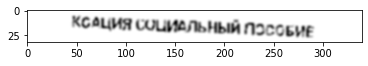

In [ ]:
batch_train = 16

train_loader = DataLoader(train_dataset, batch_size=batch_train, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64)
test_loader = DataLoader(test_dataset, batch_size=64)

x, (y, targ_lengths) = next(iter(train_loader))  # images, labels, targ_lengths
im = x[0]
print(im.shape, im.min(), im.mean(), im.max())
print(y.shape, y[0])
print(targ_lengths.shape, targ_lengths[0])
plt.imshow(im.squeeze(0), cmap='gray')
plt.show()

In [ ]:
def acc_prediction(y_target, y_pred):
    _, max_index = torch.max(y_pred, dim=-1)                                    # max_index.shape == torch.Size([T, B])
    pred_correct = 0

    for i in range(y_pred.shape[1]):
        raw_prediction = list(max_index[:, i].detach().cpu().numpy())           # len(raw_prediction) == T
        prediction = torch.IntTensor([c for c, _ in groupby(raw_prediction) if c != BLANK])
        pred_correct += len(prediction) == len(y_target[i]) and torch.all(prediction.eq(y_target[i]))

    return pred_correct / max_index.shape[1]


def train_epoh(model, criterion, train_loader, scheduler, optimizer):
    model.train()
    loss_tr = 0
    acc_tr = 0

    for x_train, (y_train,  target_lengths) in train_loader:
        x_train = x_train.to(DEVICE)                      # .view(x_train.shape[0], 1, x_train.shape[1], x_train.shape[2])

        optimizer.zero_grad()

        y_pred = model(x_train).permute(1, 0, 2)                            # y_pred.shape == torch.Size([B, T, N_CASSES])

        input_lengths = torch.IntTensor(y_train.shape[0]).fill_(model.cnn_output_width)

        loss = criterion(y_pred, y_train, input_lengths, target_lengths)
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 10)  # clip gradients
        optimizer.step()
        if scheduler:
            scheduler.step()

        loss_tr += loss.item()
        acc_tr += acc_prediction(y_train, y_pred)

    return loss_tr / len(train_loader), acc_tr / len(train_loader)


def eval_epoh(model, criterion, val_loader):
    model.eval()
    acc_val = 0
    loss_val = 0

    for x_val, (y_val, target_lengths) in val_loader:
        x_val = x_val.to(DEVICE)                         #  .view(x_val.shape[0], 1, x_val.shape[1], x_val.shape[2])
        y_pred = model(x_val).permute(1, 0, 2)

        input_lengths = torch.IntTensor(y_val.shape[0]).fill_(model.cnn_output_width)
        loss = criterion(y_pred, y_val, input_lengths, target_lengths)

        loss_val += loss.item()
        acc_val += acc_prediction(y_val, y_pred)

    return loss_val / len(val_loader), acc_val / len(val_loader)


In [ ]:
def train(model, epochs, results, scheduler, optimizer, train_loader, val_loader, n_patience, path):
    best_acc = 0
    cnt_bad = 0
    criterion = nn.CTCLoss(blank=BLANK, reduction='mean', zero_infinity=True)

    for k in range(epochs):

        train_loss, train_acc = train_epoh(model, criterion, train_loader, scheduler, optimizer)
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)

        val_loss, val_acc = eval_epoh(model, criterion, val_loader)
        results["val_loss"].append(val_loss)
        results["val_acc"].append(val_acc)

        print(f'epoh= {k + 1:2}, train_acc={train_acc:.3}, val_acc={val_acc:.3} || train_loss= {train_loss:.4}, val_loss= {val_loss:.4}')

        if val_acc > best_acc:
            best_acc = val_acc
            model = model.cpu()
            torch.save(model.state_dict(), path)
            model = model.to(DEVICE)
            cnt_bad = 0

        else:
            cnt_bad += 1

In [ ]:
################## GENERAL PARAMS #################
model_version =1
lr = 0.0006
batch_size = 16
epochs= 25
n_patience = 5

if model_version == 1:
    ################### MODEL1  ###############################
	path = '/content/gdrive/MyDrive/model.pth'
	model = CRNN(IMG_H, 
				IMG_W,
				gru_hidden_size=128,
				gru_num_layers=2,
				num_classes=N_CLASSES
				)
	model = model.to(DEVICE)
elif model_version == 2:
	################### MODEL2  ###############################
	path = '/content/model_crn2.pth'

	model = CRNN2(
				IMG_H, 
				IMG_W,
				gru_hidden_size=128,
				gru_num_layers=2,
				num_classes=N_CLASSES,                  # N_CLASSES = 93
				dropout=0.35
				).to(DEVICE)


optimizer = optim.AdamW(model.parameters(), lr)
scheduler = optim.lr_scheduler.OneCycleLR(
	  								       optimizer,
										   max_lr=lr,
									  	   steps_per_epoch=len(train_loader),
										   epochs=epochs,
										   anneal_strategy='linear'
										  )

results = {"train_acc": [], "val_acc": [], "train_loss": [], "val_loss": []}

train(model, epochs, results, scheduler, optimizer, train_loader, val_loader, n_patience, path)

epoh=  1, train_acc=0.214, val_acc=0.692 || train_loss= 1.489, val_loss= 0.02183
epoh=  2, train_acc=0.49, val_acc=0.712 || train_loss= 0.1407, val_loss= 0.008975
epoh=  3, train_acc=0.533, val_acc=0.716 || train_loss= 0.09778, val_loss= 0.005267
epoh=  4, train_acc=0.557, val_acc=0.719 || train_loss= 0.07704, val_loss= 0.004176
epoh=  5, train_acc=0.571, val_acc=0.721 || train_loss= 0.06768, val_loss= 0.003341
epoh=  6, train_acc=0.58, val_acc=0.721 || train_loss= 0.06194, val_loss= 0.002442
epoh=  7, train_acc=0.585, val_acc=0.722 || train_loss= 0.05871, val_loss= 0.001894
epoh=  8, train_acc=0.585, val_acc=0.721 || train_loss= 0.05807, val_loss= 0.001915
epoh=  9, train_acc=0.591, val_acc=0.723 || train_loss= 0.05328, val_loss= 0.0015
epoh= 10, train_acc=0.598, val_acc=0.723 || train_loss= 0.05048, val_loss= 0.0019
epoh= 11, train_acc=0.601, val_acc=0.722 || train_loss= 0.04782, val_loss= 0.001606
epoh= 12, train_acc=0.607, val_acc=0.723 || train_loss= 0.04515, val_loss= 0.001124
ep

In [ ]:
optimizer.state_dict() 
# <bound method Optimizer.state_dict of AdamW (
# Parameter Group 0
#     amsgrad: False
#     base_momentum: 0.85
#     betas: (0.950000635626887, 0.999)
#     capturable: False
#     eps: 1e-08
#     foreach: None
#     initial_lr: 2.3999999999999997e-05
#     lr: -1.4137460670454044e-09
#     max_lr: 0.0006
#     max_momentum: 0.95
#     maximize: False
#     min_lr: 2.3999999999999996e-09
#     weight_decay: 0.01
# )>

In [ ]:
!cp /content/gdrive/MyDrive/model.pth /content/model.pth
!cp /content/gdrive/MyDrive/model_crn2.pth /content/model_crn2.pth

In [ ]:
path_to_load = '/content/model.pth' if 1 == model_version else '/content/model_crn2.pth'
model.load_state_dict(torch.load(path_to_load))

<All keys matched successfully>

In [ ]:
def test_net(model, test_loader):
    model.eval()
    acc = 0

    for x_val, (y_val, target_lengths) in test_loader:
        x_val = x_val.to(DEVICE)                         #  .view(x_val.shape[0], 1, x_val.shape[1], x_val.shape[2])
        y_pred = model(x_val)
        acc += acc_prediction(y_val, y_pred.permute(1, 0, 2))

    print("test_accuracy:", acc.item() / len(test_loader))


test_net(model, test_loader)        # w/o augment =  0.7332 || with augment 0.7293 ||0.728

test_accuracy: 0.7324837596819794


In [ ]:
predictions = []

x, (y, ln_targ) = next(iter(test_loader))    # .view(x_train.shape[0], 1, x_train.shape[1], x_train.shape[2])
x = x.to(DEVICE)                                  
predictions, conf = model.predict_text(x)

for j, txt_pred in  enumerate(predictions):
    txt_orig = ''.join([CHARS[d - 1] for d in y[j].tolist() if d > 0])
    if txt_pred != txt_orig:
        print("not equal:\n", txt_pred, '||', txt_orig, '\t\t', "confidence=", conf[j])
    elif j < 10:
        print(txt_pred, '||', txt_orig, '\t\t', "confidence=", conf[j])


нтересованный в экскурсия || нтересованный в экскурсия 		 confidence= 0.7439309
ОГА В СТРЕМЯ), НО СЕГОДНЯ || ОГА В СТРЕМЯ), НО СЕГОДНЯ 		 confidence= 0.5218677
ТОРОННИК". КАК ОТМЕЧАТЬСЯ || ТОРОННИК". КАК ОТМЕЧАТЬСЯ 		 confidence= 0.5239833
отношение вооруженный под || отношение вооруженный под 		 confidence= 0.8448677
А. ОН ВИДЕТЬ СТАРУШКА, НА || А. ОН ВИДЕТЬ СТАРУШКА, НА 		 confidence= 0.56153995
, что поручение президент || , что поручение президент 		 confidence= 0.54286665
дом с такой же огромный м || дом с такой же огромный м 		 confidence= 0.65761
сам он отрицать причастн || сам он отрицать причастн 		 confidence= 0.7194849
ЮЧАТЬ ПОМИМО ОН ОСОБЫЙ ТИ || ЮЧАТЬ ПОМИМО ОН ОСОБЫЙ ТИ 		 confidence= 0.5014228
турция. если он задержив || турция. если он задержив 		 confidence= 0.50455296


Качество на тесте в тех же границах, что и трейн и валидация. Возможно(!!!) все еще есть проблеммы с датасетом- совершенно неожиданно выявил 854 пустых текстовых файла, которые соответствовали вполне содержательным изображениям. Может нужно поудалять еще что-то, и одновременно:
- аугментация кажется слабой,
- сетку можно попробовать усложнить, раз она обучается...

Но это все - следующие этапы. Пока что на повестке "скрестить ужа с ежом" - дефолтный детектор из open-cv с обученным recognizer...

## Совмещение встроенного детектора и обученного recognizer.

In [ ]:
#model
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
from tqdm import tqdm, tqdm_notebook
from torchvision import transforms, models, datasets
from torch.utils.data import Dataset, DataLoader

# general
import cv2
import os
import string
import numpy as np
from collections import Counter

import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
# !wget https://drive.google.com/drive/folders/1cTbQ3nuZG-EKWak6emD_s8_hHXWz7lAr?usp=sharing

In [ ]:
# from models.crnn import CRNN


# model = CRNN(32, 1, 37, 256)
# model.load_state_dict(torch.load('crnn.pth'))
# dummy_input = torch.randn(1, 1, 32, 100)
# torch.onnx.export(model, dummy_input, "crnn.onnx", verbose=True)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
!pip install mtcnn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 6.5 MB/s 


In [ ]:
from itertools import groupby
from mtcnn import MTCNN


IMG_H, IMG_W = (32, 340)
MEAN_IMG = 0.8848 
STD_IMG = 0.3245
CHARS = list(' !"()*,-.0123456789:;<>?[]ЁАБВГДЕЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯабвгдежзийклмнопрстуфхцчшщъыьэюяё')
N_CLASSES = len(CHARS) + 1
BLANK = 0

CURRENT = "current.png"
letters = "".join([chr(x) for x in range(ord('а'), ord('я') + 1)]) + 'ё'
letters = letters + letters.upper()

DEVICE = torch.device('cuda') if torch.cuda.is_available() else 'cpu'
if not torch.cuda.is_available():
    print("А где же ГПУ?")


class NotFacesFoundError(Exception):
    pass

class NameNotFoundError(Exception):
    pass


А где же ГПУ?


In [ ]:
class CRNN(nn.Module):
    def __init__(self, IMG_H, IMG_W, gru_hidden_size, gru_num_layers, num_classes):
        super().__init__()
        self.IMG_H = IMG_H
        self.IMG_W = IMG_W
        self.gru_input_size = (IMG_H // 4 - 3) * 64
        self.cnn_output_width = IMG_W // 4 - 3
        self.conv = nn.Sequential(
                                  nn.Conv2d(1, 32, kernel_size=(3, 3)),
                                  nn.InstanceNorm2d(32),
                                  nn.LeakyReLU(),

                                  nn.Conv2d(32, 32, kernel_size=(3, 3)),
                                  nn.MaxPool2d((2, 2)),
                                  nn.InstanceNorm2d(32),
                                  nn.LeakyReLU(),

                                  nn.Conv2d(32, 64, kernel_size=(3, 3)),
                                  nn.InstanceNorm2d(64),
                                  nn.LeakyReLU(),

                                  nn.Conv2d(64, 64, kernel_size=(3, 3)),
                                  nn.MaxPool2d((2, 2)),
                                  nn.InstanceNorm2d(64),
                                  nn.LeakyReLU()
                                 )

        self.gru = nn.GRU(self.gru_input_size, gru_hidden_size, gru_num_layers,
                          batch_first=True, bidirectional=True)

        self.classifier = nn.Sequential(
                                nn.Linear(gru_hidden_size * 2, gru_hidden_size),
                                nn.BatchNorm1d(self.cnn_output_width),
                                nn.ReLU(),
                                nn.Linear(gru_hidden_size, num_classes)
                               )

    def forward(self, x):
        batch_size = x.shape[0]
        out = self.conv(x)
        out = out.view(batch_size, -1, out.shape[-1])  # [batch_size, cnn_output_height * channels_out, T]
        out = out.transpose(2, 1)                      # [batch_size, T, cnn_output_height * channels_out]
        out, _ = self.gru(out)
        return F.log_softmax(self.classifier(out), dim=-1)


    def predict_text(self, x):
        with torch.no_grad():
            y_pred = self.forward(x)
            _, max_index = torch.max(y_pred, dim=-1)                            # max_index.shape == torch.Size([T, B]
            text_predictions = []

            for i in range(y_pred.shape[0]):
                raw_prediction = list(max_index[i, :].detach().cpu().numpy())   # len(raw_prediction) == T
                text_prediction = ''.join([CHARS[c - 1] for c, _ in groupby(raw_prediction) if c != BLANK])
                text_predictions.append(text_prediction)

            log_conf_char = y_pred.detach().cpu().numpy().max(axis=-1)
            log_conf_word = log_conf_char.min(axis=-1)

            return text_predictions, np.exp(log_conf_word)


    def recognize(self, img_file_name):
        # ! batch_size = 1
        im0 = cv2.imread(img_file_name, 0)
        # 0. binarize
        im0 = cv2.threshold(im0, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
        # 1.1. rotate if need
        h, w = im0.shape
        if h > w:
            im0 = np.rot90(im0)
        
        # 1.2. adjust text size to chunks (IMG_H, IMG_W)
        text = ""
        conf = 1
        while im0 is not None:
            h, w = im0.shape
            if h > w: 
                break

            # 1.3. resize and fill with whitespaces
            scale_factor = IMG_H / h
            w_opt = int(round(IMG_W / scale_factor, 0))

            if w <= 1.1 * w_opt:
                img = im0.copy()
                im0 = None                                      # last iteration with long image or alone iteration with short
                if w < 0.9 * w_opt:
                    img = np.hstack((img, np.ones((h, w_opt - w), np.uint8) * 255))
            else :
                img = im0[:, :w_opt + 1]
                im0 = im0[:, w_opt - 1:]          # some intersection betwin chunks (2 pixel)
            
            # 1.4. word, conf_word = self.process_chunk(img)
            img = cv2.resize(img, (IMG_W, IMG_H), interpolation=cv2.INTER_AREA)
            # 1.5. image to tenzor
            x = transforms.ToTensor()(img).unsqueeze(0)
            x = transforms.Normalize(mean=[MEAN_IMG], std=[STD_IMG])(x)

            # 2. recognize and decode, compute confidence
            text_chunk, conf_chunk = self.predict_text(x)
            text += text_chunk[0]
            conf = min(conf, conf_chunk[0])

        return text, conf


In [ ]:
filenames = []
for filename in sorted(os.listdir(os.getcwd())):
    if filename.endswith('.jpeg') or filename.endswith('.png'):
        filenames.append(filename)
", ".join(filenames)

'0.jpeg, 1.jpeg, 2.jpeg, 3.jpeg, 4.png, 5.jpeg, 6.jpeg, 7.jpeg, 8.jpeg, 9.jpeg'

In [ ]:
class PassportReader:

    def __init__(self, face_detector, recognizer, temp_file=CURRENT,
                 mask_photo=False, denoiser=None, erode_kernel=(1, 1),
                 dilate_kernel=(18, 18), tr_conf=0.5, dilate_iterations=1,
                 show_boxes=True, clear_data=True):
        self.face_detector = face_detector
        self.recognizer = recognizer
        self.temp_file = temp_file
        self._mask_photo = mask_photo
        self.erode_kernel = erode_kernel
        self.dilate_kernel = dilate_kernel
        self._clear_data = clear_data
        self._init_data()
        self.tr_conf = tr_conf
        self.show_boxes = show_boxes
        self.dilate_iterations=dilate_iterations

        self._denoiser_methods = ('billateral', 'custom', 'gaussian', None)      # 'nlmeans' -not good
        self._denoiser = denoiser
        assert self._denoiser in self._denoiser_methods


    def _init_data(self):
        self._data = dict()


    def _save_rectangle(self, img, x, y, x2, y2):
        im = self._data["img"][y: y2, x: x2]
        cv2.imwrite(self.temp_file, im)


    @staticmethod
    def get_mask(shape, x1, y1, x2, y2, value=255):
        mask = np.zeros(shape[:2], np.uint8)
        cv2.rectangle(mask, (x1, y1), (x2, y2), color=value, thickness=-1)
        return mask


    @staticmethod
    def _apply_denoiser(img, denoiser):

        if 'gaussian' == denoiser:
            return cv2.GaussianBlur(img, (3, 3), 0, cv2.BORDER_CONSTANT)

        elif 'billateral' == denoiser:
            ret, _ = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            return cv2.bilateralFilter(img, 3, int(0.1 * ret), max(1.3 * ret, 100))

        elif 'custom' == denoiser:
            kernel = np.ones((1, 1), np.uint8)
            img = cv2.erode(img, kernel, iterations=1)
            img = cv2.dilate(img, kernel, iterations=1)
            img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
            return cv2.medianBlur(img, 3)


    def _compute_extra_border(self):
        im = self._data["img"]
        corners = np.uint0(cv2.goodFeaturesToTrack(im, 20, 0.05, 200))
        x_min, y_min = im.shape
        x_max, y_max = 0, 0
        for corner in corners:
            x, y = corner.ravel()
            x_min, y_min = min(x_min, x), min(y_min, y)
            x_max, y_max = max(x_max, x), max(y_max, y)
        return (x_min, y_min, x_max, y_max)


    def _erode_dilate(self, img):
        im_not = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                       cv2.THRESH_BINARY_INV, 15, 9)  # 11, 7
        if self.erode_kernel:
            kernel = np.ones(self.erode_kernel, np.uint8)
            im_not = cv2.erode(im_not, kernel, iterations=1)
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, self.dilate_kernel)
        im_not = cv2.dilate(im_not, kernel, iterations=self.dilate_iterations)
        # return im_not
        return cv2.bitwise_not(im_not)


    @staticmethod
    def test_coord(box, test_box):
        x, y, w, h = box
        x_min, y_min, x_max, y_max = test_box
        return (x >= x_min) and (y >= y_min) and (x + w <= x_max) and (y + h <= y_max)


    def _compute_face_coord_cnn(self, im_bgr):
        im_rgb = cv2.cvtColor(im_bgr, cv2.COLOR_BGR2RGB)
        res = self.face_detector.detect_faces(im_rgb)
        boxes = [item.get('box') for item in res]
        boxes = [box for box in boxes if self.test_coord(box, self._data["extr_coord"])]
        if not boxes:
            raise NotFacesFoundError(boxes)
        return boxes[0]


    def _compute_target_border_coord(self ):
        "find target box coordinates from face coordinates"
        x, y, w, h = self._data["face_coord"]
        x1, y1 = x + int(1.9 * w), y - int(1.29 * h)
        x2, y2 = x + int(7.6 * w), y + h - int(0.33 * h)
        return (x1, y1, x2, y2)


    def _paint_photo_median(self):
        "blur photo with median value"
        x, y, w, h = self._data.get("face_coord")
        img = self._data["img"]
        x1, y1 = int(x - 0.2 * w), int(y - 0.2 * h)
        x2, y2 = int(x + 1.2 * w), int(y + 1.2 * h)
        mask1 = self.get_mask(img.shape, x1, y1, x2, y2, np.median(img))
        return cv2.bitwise_or(img, mask1)


    @staticmethod
    def check_board_white(im):
        h, w = im.shape
        border_value = (sum(im[0, :] + im[-1, :]) + sum(im[:, 0] + im[:, -1]))
        return border_value < 2 * 255 * (h + w)


    def get_text_result(self, textes):
        return textes
        # res = [pair for pair in res if check_coord(pair[0], tr_h, w_c)]    # отбросили те, что ниже порога
        # res = sorted(sorted(res, key=lambda pair: pair[0][0][0]), key=lambda pair: pair[0][0][1])   # "Y" по возрастанию ("Х" по возрастанию)

        # keys = ("Фамилия", "Имя", "Отчество")
        # answer = {key: val[-1] for key, val in zip(keys, res)}
        # if len(answer) == 3:
        #     return answer
        # raise NameNotFoundError


    def _handle_contours(self, contours, hierarchy):
        if hierarchy is None:
            return []

        # 1.1 filter contours by hierarhy and target_box`s coordinates , compute area
        boxes_area = []
        h_values = []
        test_coord = self._data["target_box_coord"]
        for cnt, hr in zip(contours, hierarchy[0]):
            x, y, w, h = cv2.boundingRect(cnt)
            if self.test_coord((x, y, w, h), test_coord):
                boxes_area.append((w * h, (x, y, w, h)))
                h_values.append(h)

        if not boxes_area or len(boxes_area) < 3:
            return []

        # 1.2. filter contours by area and heihgt ox boxes
        max_area = sorted(boxes_area,reverse=True)[0][0]
        h_tr = 0.6 * sum(sorted(h_values[-3:])) / 3
        boxes = [box for area_box, box in boxes_area if \
                     (area_box >= 0.1 * max_area) and (box[2] >= h_tr)]

        res = []
        # boxes = [(260, 400, 100, 30), (240, 373, 80, 30), (248, 333, 60, 30)]
        for x, y, w, h in boxes:
            # 1. for recognizer`s interface image have to be stored in file
            self._save_rectangle(self._data["img"], x, y, x + w, y + h)
            # 2. load file and recognize
            text, confidence = self.recognizer.recognize(self.temp_file)
            words = [word.upper() for word in text.split()] # if word.isalpha()]            # ["WORD_A", "WORD_B"]
            if words and confidence > self.tr_conf:
                res.append((x, y, w, h, " ".join(words), confidence))
                print(f"result:({x, y, w, h}), conf: {confidence:.5}, text: {text}")
        return res


    def _simple_recognition_gray(self):
        img = self._data["img"]
        # out = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]  
        out = self._erode_dilate(img)
        ## find contours for blocks with text
        median = np.median(out)
        lower = max(0, int(0.8 * median))
        upper = min(255, int(1.2 * median))
        out = cv2.Canny(out, lower, upper)                                            
        self._data["cann"] = out

        contours, hierarchy = cv2.findContours(out, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        # contours, hierarchy = cv2.findContours(out, cv2.RETR_EXTERNAL,
        #                                     cv2.CHAIN_APPROX_NONE)
        # parse text for each box
        boxes_with_text = self._handle_contours(contours, hierarchy)            # [(coord, text, confidence), ... ]
        # sort textes by coordinates and compound answer
        answer = self.get_text_result(boxes_with_text)
        return answer


    def convert_image2text(self, image_file):
        img_c = cv2.imread(image_file)
        # 0. store gray_image
        self._data["img"] = cv2.cvtColor(img_c, cv2.COLOR_BGR2GRAY)
        # 1.1 precompute extra border
        self._data["extr_coord"] = self._compute_extra_border()
        # 1.2. define photo coordinates
        self._data["face_coord"] = self._compute_face_coord_cnn(img_c)          #  NotFacesFoundError!!
        # 1.3. precompute target coordinates
        self._data["target_box_coord"] = self._compute_target_border_coord()

        if self._denoiser:
            self._data["img"] = self._apply_denoiser(self._data["img"],
                                                     self._denoiser)

        if self._mask_photo:
            self._data["img"] = self._paint_photo_median()                     

        # 2. collect rectangles with text
        boxes_with_text = self._simple_recognition_gray()

        if self.show_boxes:
            self._plot_result(boxes_with_text)

        if self._clear_data:
            self._init_data()
        return boxes_with_text


    def _plot_result(self, boxes):
        img = self._data["img"]
        x, y, w, h = self._data["face_coord"]
        cv2.rectangle(img, (x, y), (x + w, y + h), 0, 2)

        mask2 = self.get_mask(img.shape, *self._data["target_box_coord"])
        cropp = cv2.bitwise_and(img, img, mask=mask2)
        for x, y, w, h, _, _ in boxes:
            cv2.rectangle(cropp, (x, y), (x + w, y + h), 0, 2)

        fig, ax = plt.subplots(1, 3, figsize=(18, 20))
        ax[0].imshow(img, cmap='gray', vmin=0, vmax=255)
        ax[1].imshow(cropp, cmap='gray', vmin=0, vmax=255)
        ax[2].imshow(self._data["cann"], cmap='gray', vmin=0, vmax=255)
        plt.show()


In [ ]:
!cp /content/gdrive/MyDrive/model.pth /content/model.pth
!cp /content/gdrive/MyDrive/model_crn2.pth /content/model_crn2.pth

model_version = 1

path_to_load = '/content/model.pth' if 1 == model_version else '/content/model_crn2.pth'
model.load_state_dict(torch.load(path_to_load))

<All keys matched successfully>

In [ ]:
recognizer = model
del model

# recognizer = CRNN2(
#                    IMG_H, 
#                    IMG_W,
#                    gru_hidden_size=128,
#                    gru_num_layers=2,
#                    num_classes=93,
#                    dropout=0.25
#                   ).to(DEVICE)
# PATH_WEIHTS = '/content/gdrive/MyDrive/model_crn2.pth'

recognizer.load_state_dict(torch.load(path_to_load))
recognizer.eval()

face_detector = MTCNN()


0.jpeg
1/1 [==============================] - 0s 37ms/step
result:((396, 384, 17, 22)), conf: 0.32042, text: ) Б
result:((396, 384, 17, 22)), conf: 0.32042, text: ) Б


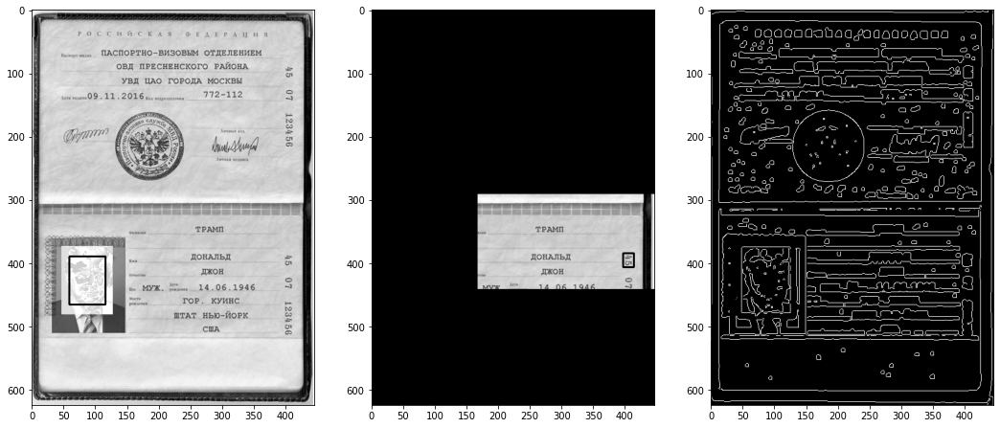

found dilate_kernel=(5, 5), er_ker=(1, 1), denoiser=billateral
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 36ms/step
result:((264, 406, 41, 15)), conf: 0.4073, text: ЕЙКЕЙ
result:((264, 406, 41, 15)), conf: 0.4073, text: ЕЙКЕЙ
result:((183, 350, 54, 7)), conf: 0.2657, text: шшшшшщйн         
result:((183, 350, 54, 7)), conf: 0.2657, text: шшшшшщйн         
result:((248, 339, 57, 19)), conf: 0.41643, text: Т Р -6Т
result:((248, 339, 57, 19)), conf: 0.41643, text: Т Р -6Т


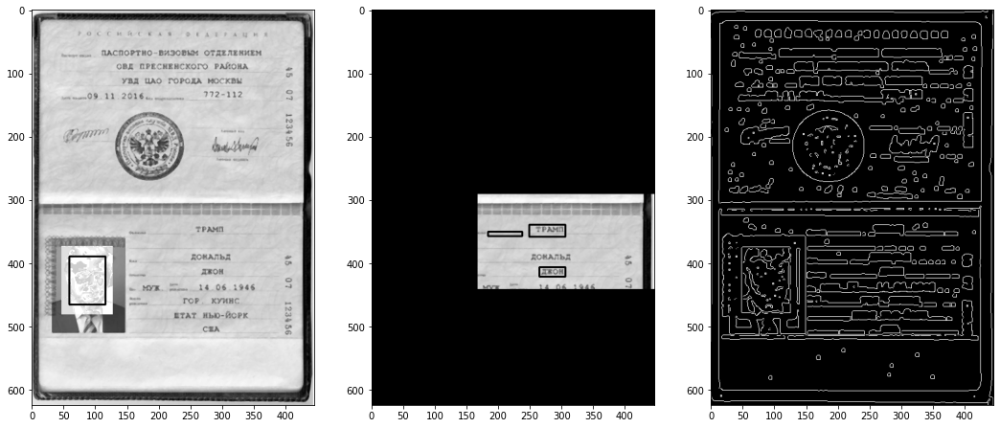

found dilate_kernel=(5, 5), er_ker=(1, 1), denoiser=custom
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 46ms/step
result:((339, 417, 53, 7)), conf: 0.28565, text: шшшшЙДЩЩН       


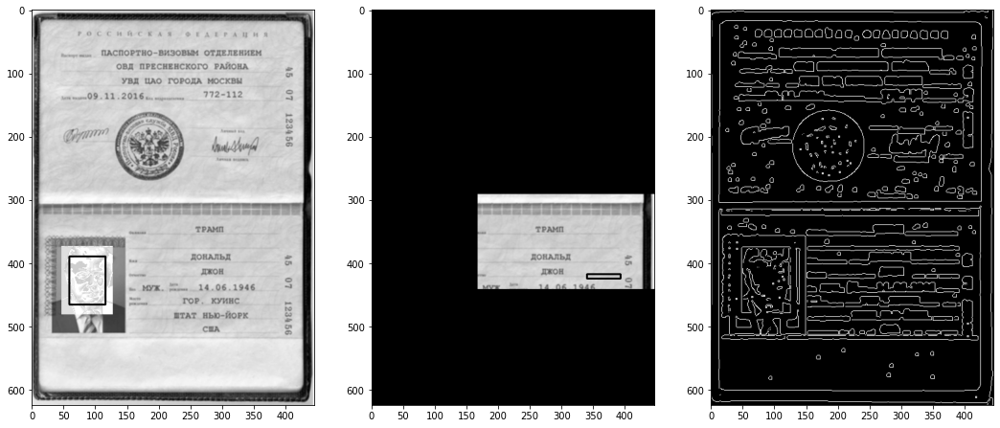

found dilate_kernel=(5, 5), er_ker=(1, 1), denoiser=gaussian
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 38ms/step
result:((264, 406, 132, 20)), conf: 0.57288, text: ДХОЕ
result:((396, 384, 17, 22)), conf: 0.3914, text: ) Б
result:((396, 384, 17, 22)), conf: 0.3914, text: ) Б


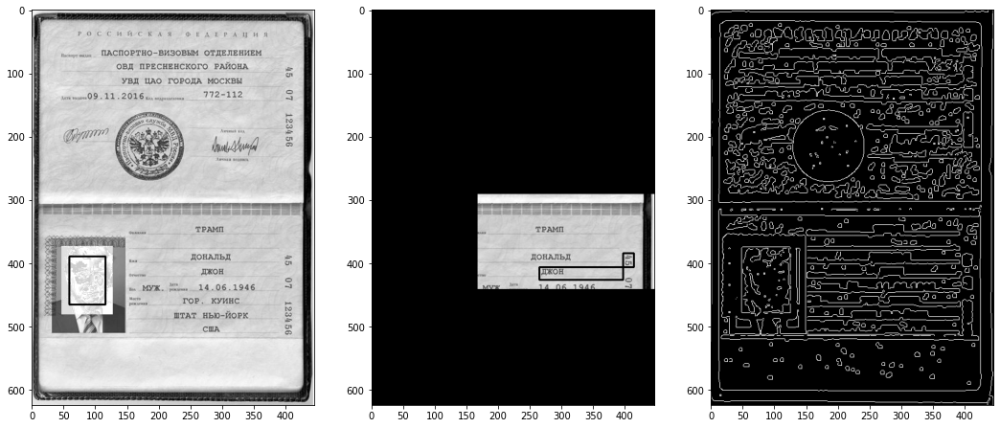

found dilate_kernel=(5, 5), er_ker=(1, 1), denoiser=None
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 38ms/step
result:((396, 384, 17, 22)), conf: 0.32042, text: ) Б
result:((396, 384, 17, 22)), conf: 0.32042, text: ) Б


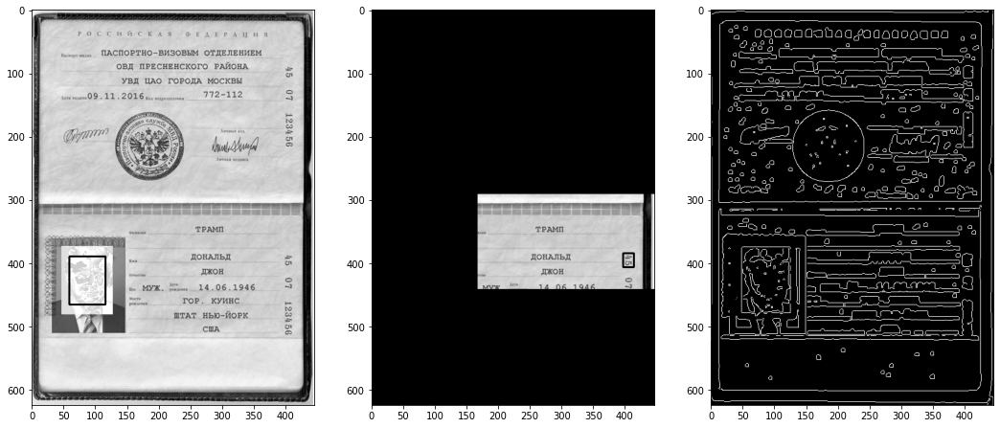

found dilate_kernel=(5, 5), er_ker=None, denoiser=billateral
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 42ms/step
result:((264, 406, 41, 15)), conf: 0.4073, text: ЕЙКЕЙ
result:((264, 406, 41, 15)), conf: 0.4073, text: ЕЙКЕЙ
result:((183, 350, 54, 7)), conf: 0.2657, text: шшшшшщйн         
result:((183, 350, 54, 7)), conf: 0.2657, text: шшшшшщйн         
result:((248, 339, 57, 19)), conf: 0.41643, text: Т Р -6Т
result:((248, 339, 57, 19)), conf: 0.41643, text: Т Р -6Т


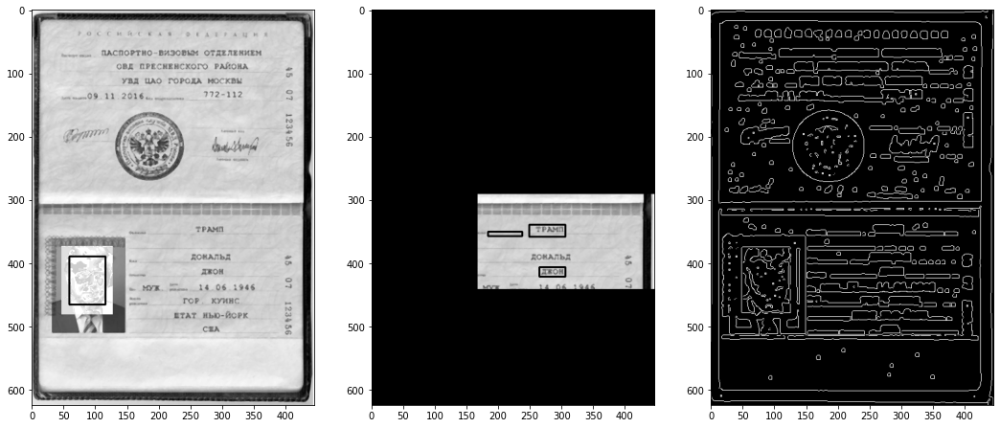

found dilate_kernel=(5, 5), er_ker=None, denoiser=custom
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 43ms/step
result:((339, 417, 53, 7)), conf: 0.28565, text: шшшшЙДЩЩН       


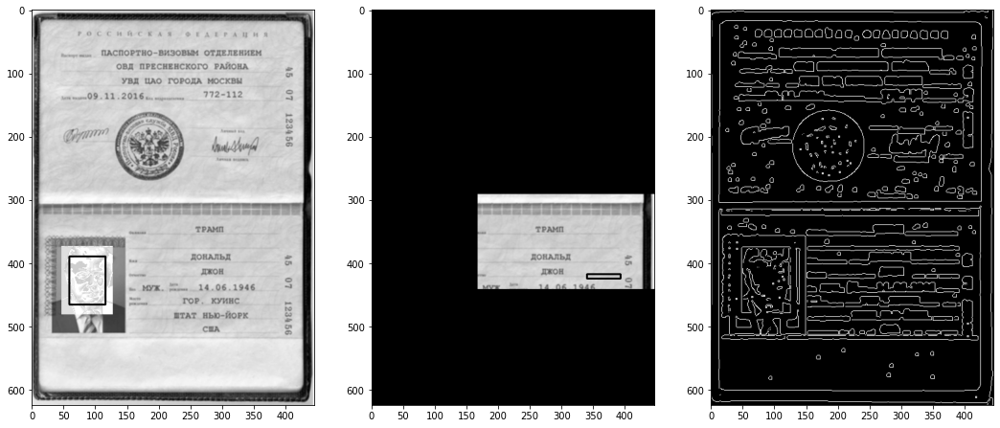

found dilate_kernel=(5, 5), er_ker=None, denoiser=gaussian
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 42ms/step
result:((264, 406, 132, 20)), conf: 0.57288, text: ДХОЕ
result:((396, 384, 17, 22)), conf: 0.3914, text: ) Б
result:((396, 384, 17, 22)), conf: 0.3914, text: ) Б


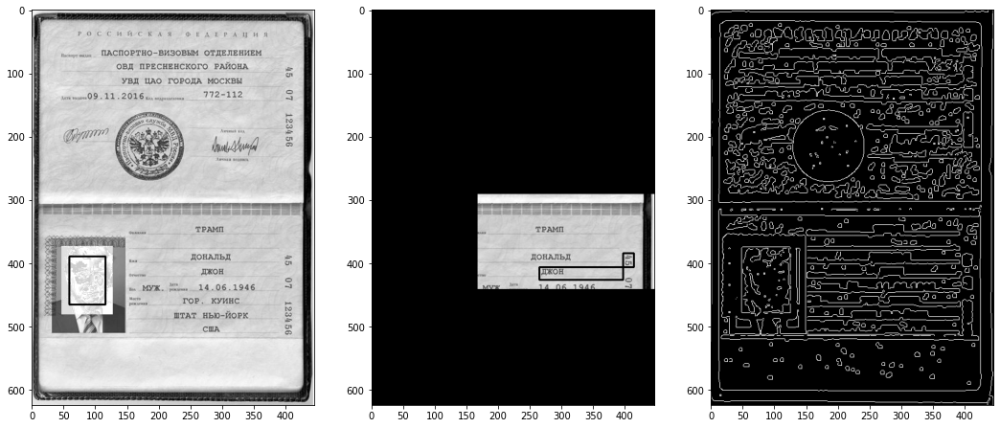

found dilate_kernel=(5, 5), er_ker=None, denoiser=None
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 46ms/step


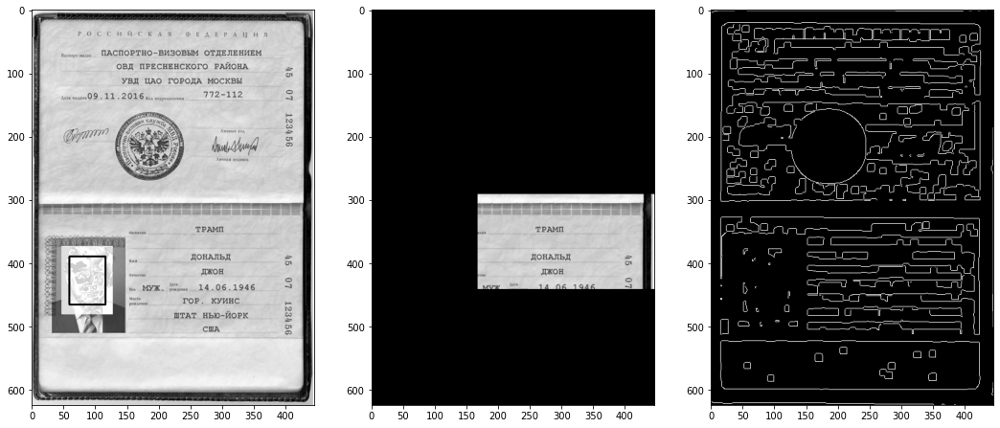

found dilate_kernel=(10, 10), er_ker=(1, 1), denoiser=billateral
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 41ms/step


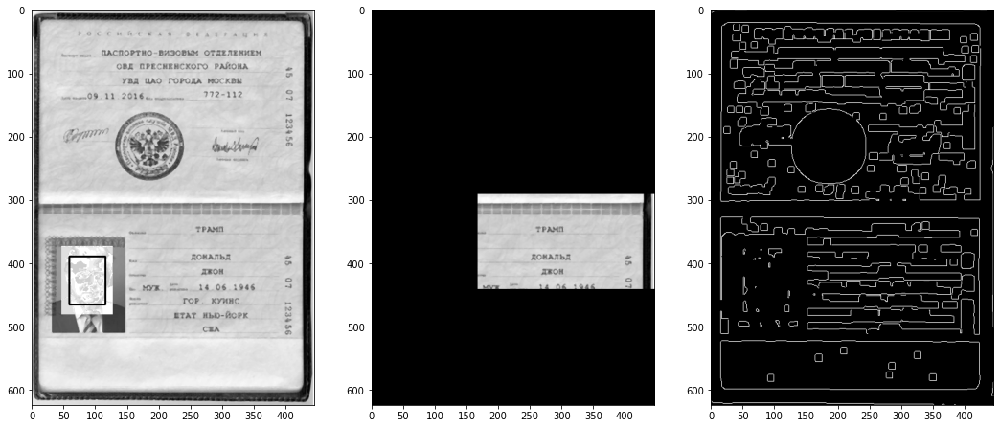

found dilate_kernel=(10, 10), er_ker=(1, 1), denoiser=custom
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 36ms/step


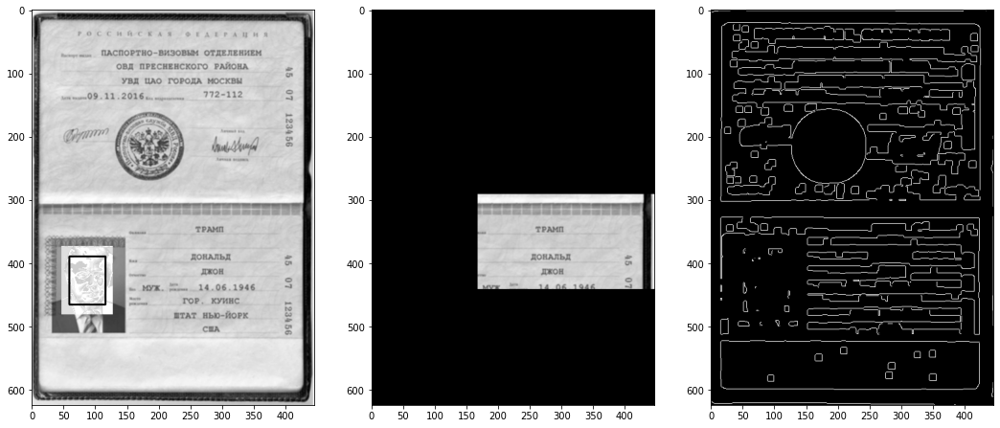

found dilate_kernel=(10, 10), er_ker=(1, 1), denoiser=gaussian
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 34ms/step
result:((398, 366, 26, 37)), conf: 0.49371, text: АБ


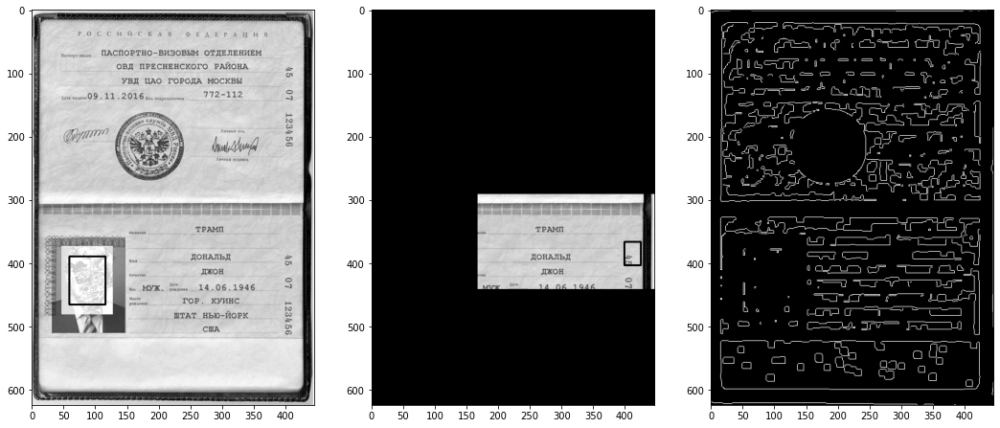

found dilate_kernel=(10, 10), er_ker=(1, 1), denoiser=None
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 37ms/step


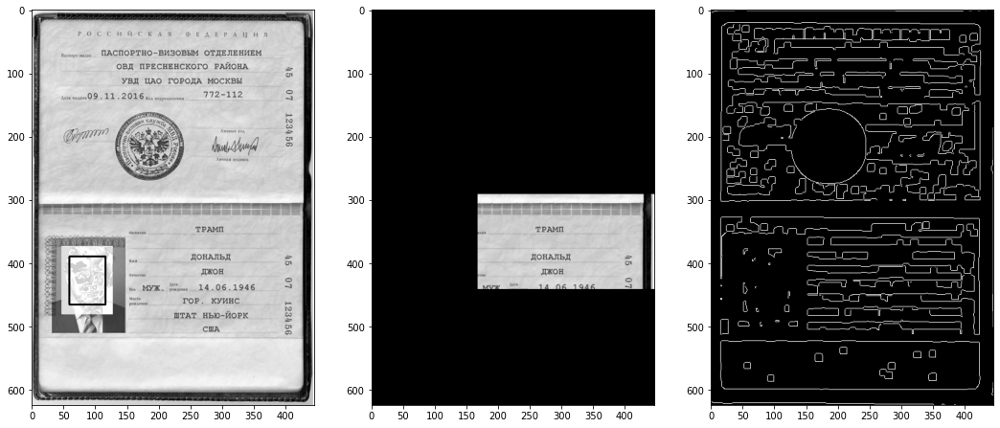

found dilate_kernel=(10, 10), er_ker=None, denoiser=billateral
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 57ms/step


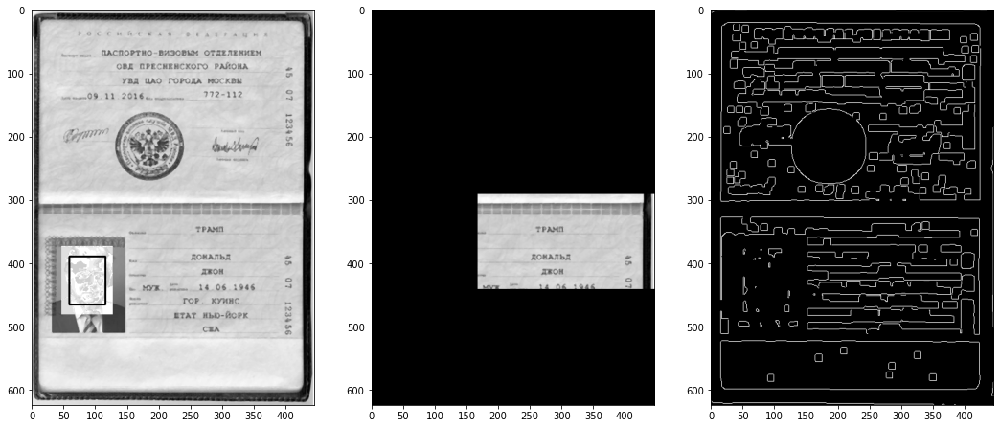

found dilate_kernel=(10, 10), er_ker=None, denoiser=custom
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 47ms/step


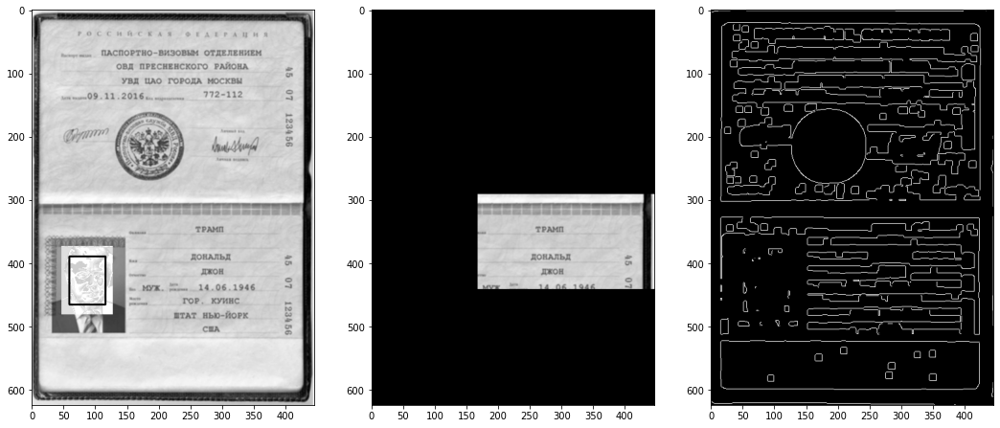

found dilate_kernel=(10, 10), er_ker=None, denoiser=gaussian
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 47ms/step
result:((398, 366, 26, 37)), conf: 0.49371, text: АБ


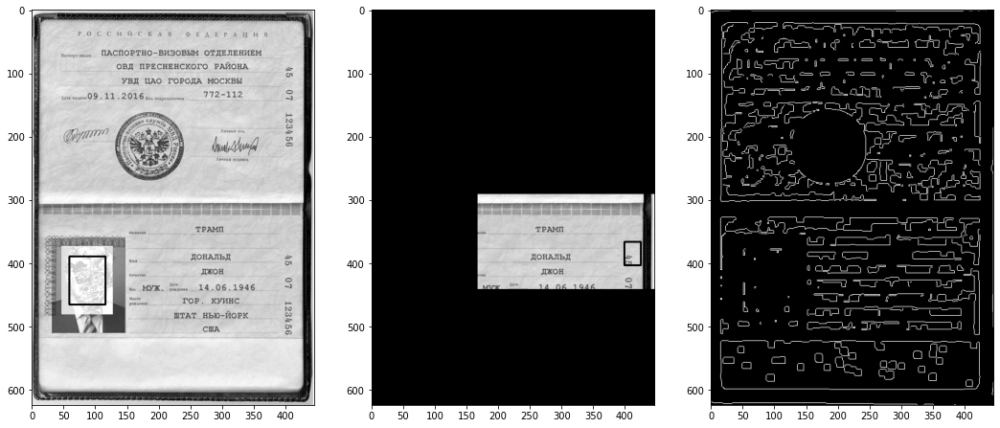

found dilate_kernel=(10, 10), er_ker=None, denoiser=None
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 54ms/step


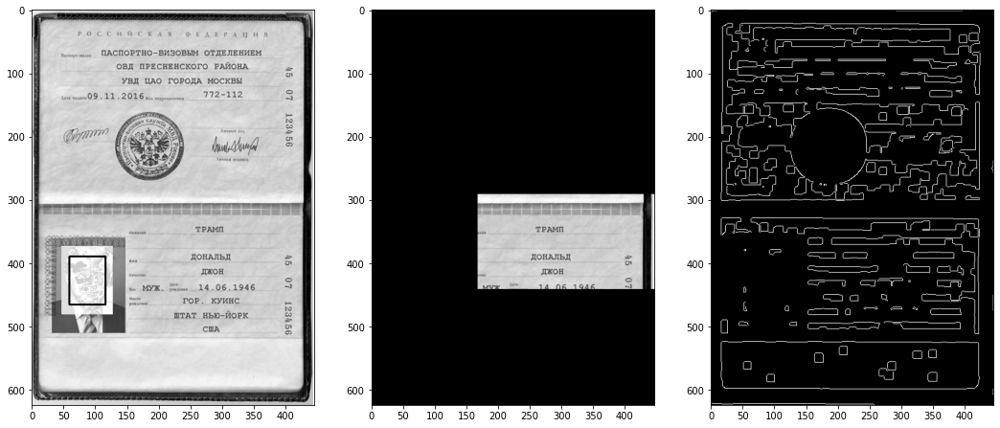

found dilate_kernel=(12, 12), er_ker=(1, 1), denoiser=billateral
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 50ms/step


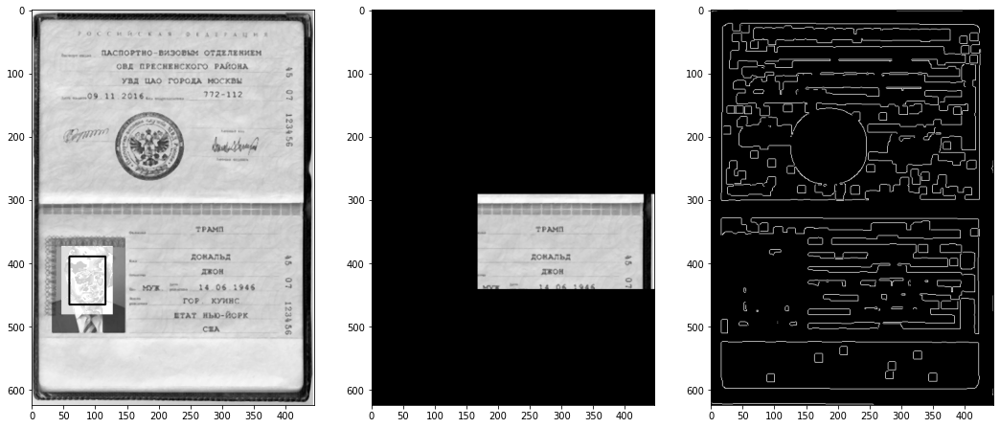

found dilate_kernel=(12, 12), er_ker=(1, 1), denoiser=custom
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 48ms/step
result:((275, 406, 73, 25)), conf: 0.30238, text: жсв
result:((262, 404, 47, 23)), conf: 0.32108, text: ржод


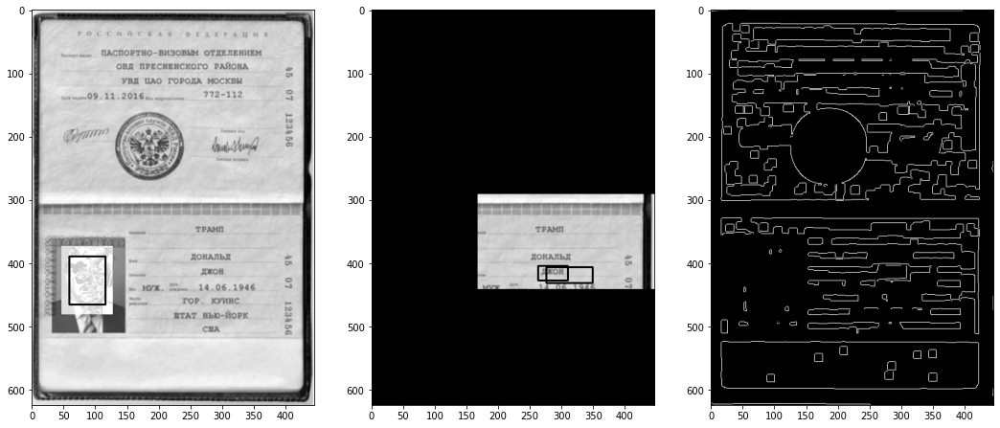

found dilate_kernel=(12, 12), er_ker=(1, 1), denoiser=gaussian
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 44ms/step
result:((178, 427, 35, 10)), conf: 0.25685, text: гп рмн.


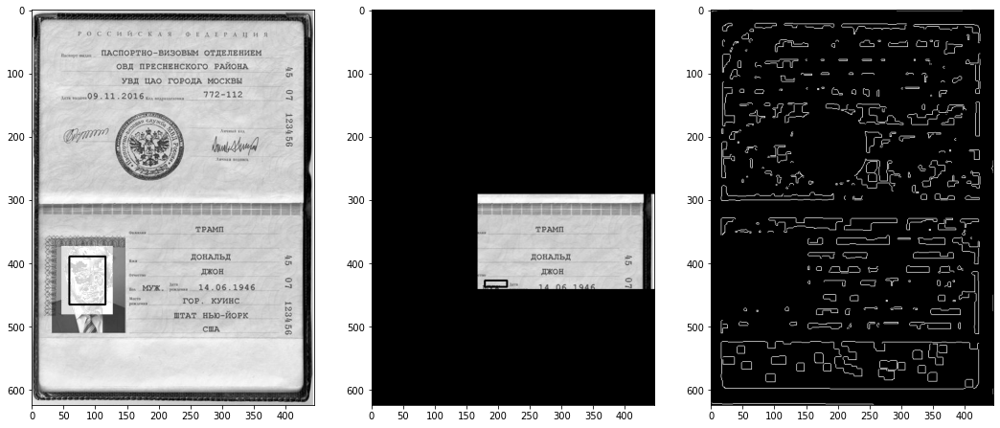

found dilate_kernel=(12, 12), er_ker=(1, 1), denoiser=None
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 66ms/step


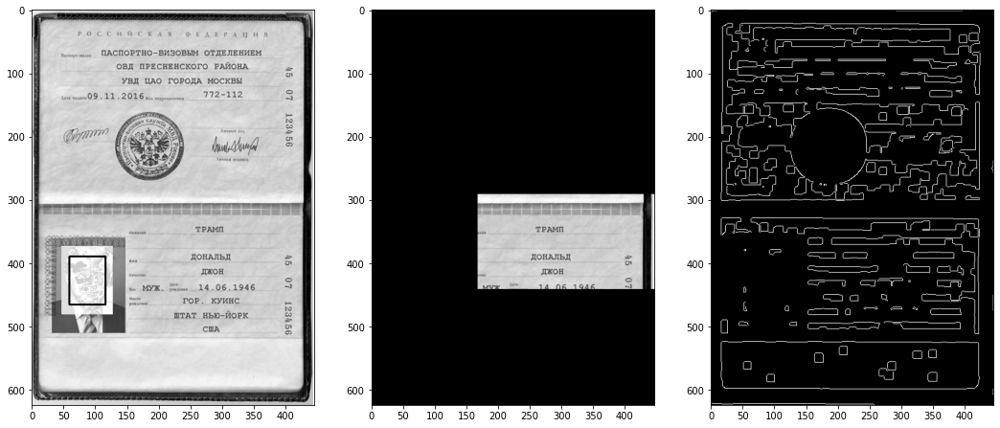

found dilate_kernel=(12, 12), er_ker=None, denoiser=billateral
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 67ms/step


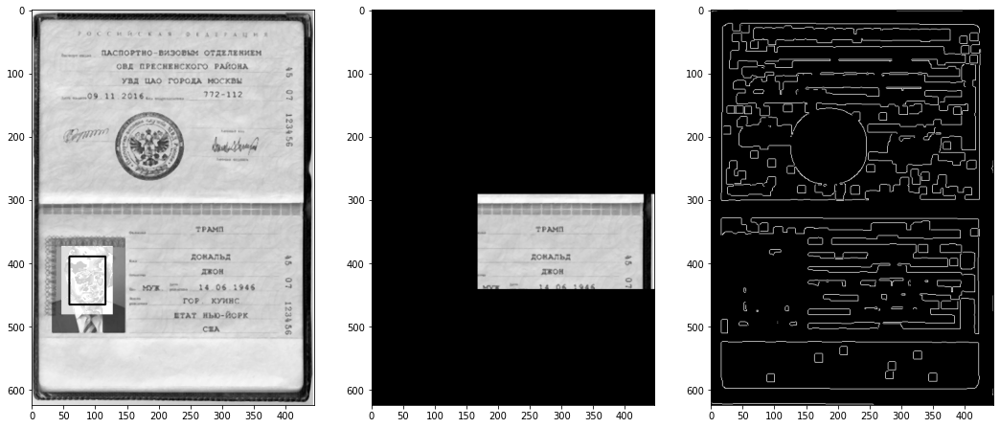

found dilate_kernel=(12, 12), er_ker=None, denoiser=custom
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 70ms/step
result:((275, 406, 73, 25)), conf: 0.30238, text: жсв
result:((262, 404, 47, 23)), conf: 0.32108, text: ржод


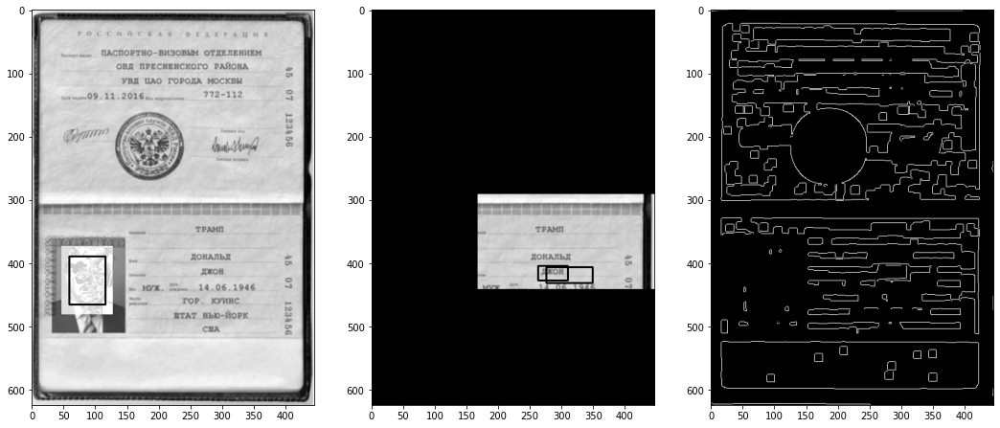

found dilate_kernel=(12, 12), er_ker=None, denoiser=gaussian
----------------------------------------
0.jpeg
1/1 [==============================] - 0s 55ms/step
result:((178, 427, 35, 10)), conf: 0.25685, text: гп рмн.


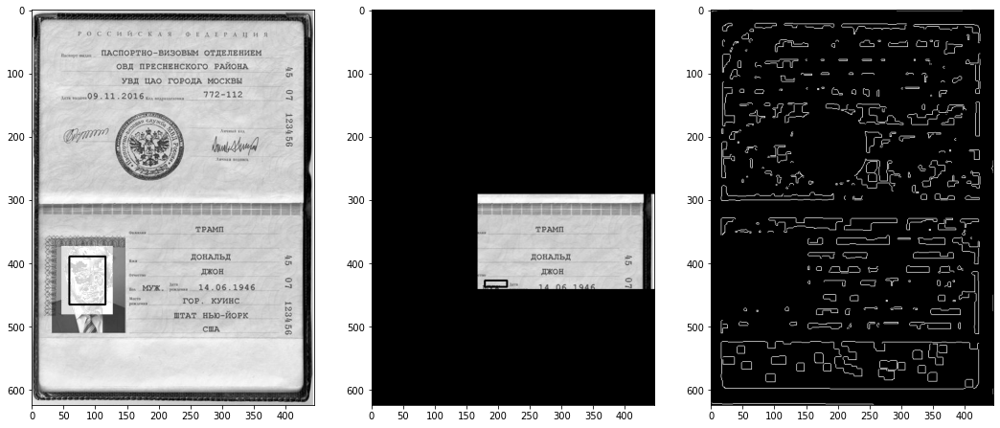

found dilate_kernel=(12, 12), er_ker=None, denoiser=None
----------------------------------------


In [ ]:
for d_ker in ((5, 5), (10, 10), (12, 12)):
    for er_ker in ((1, 1),  None):                
        for denoiser in ('billateral', 'custom', 'gaussian', None):

            fio_reader = PassportReader(face_detector, recognizer,
                                        temp_file=CURRENT,
                                        mask_photo=True,
                                        denoiser=denoiser,
                                        erode_kernel=er_ker,
                                        dilate_kernel=d_ker,
                                        dilate_iterations=1,
                                        show_boxes=True,
                                        clear_data=True,
                                        tr_conf=0.25,
                                        )

            for file_name in filenames:
                print(file_name)
                try:
                    boxes = fio_reader.convert_image2text(file_name)
                    # if len(boxes) > 0:
                    print(f"found dilate_kernel={d_ker}, er_ker={er_ker}, denoiser={denoiser}")

                except NotFacesFoundError:
                    print("Not found face --> aborted")
                except NameNotFoundError as e:
                    print("NameNotFoundError <> file_name, texts:", file_name, texts)
                print("--" * 20)
                break


0.jpeg
1/1 [==============================] - 0s 43ms/step
result:((260, 400, 100, 30)), conf: 0.24837, text: дзои
result:((240, 373, 80, 30)), conf: 0.39952, text: дсслльд
result:((248, 333, 60, 30)), conf: 0.48736, text: трА>е


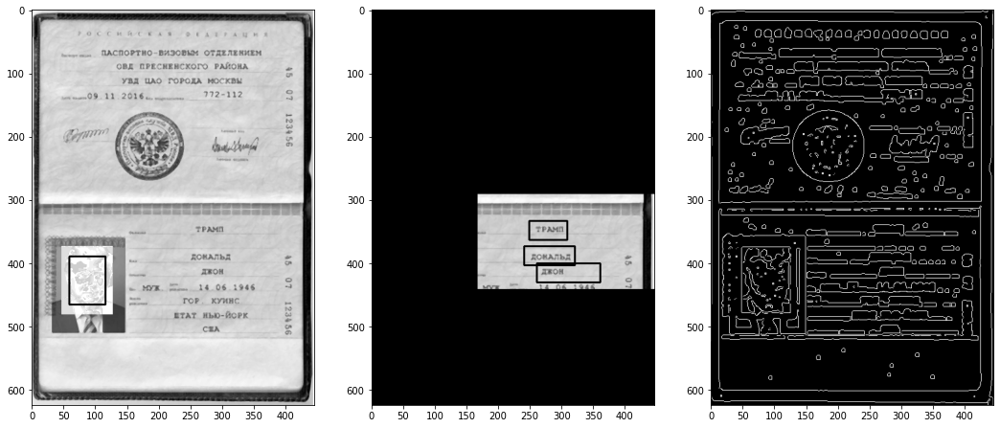

found dilate_kernel=(5, 5), er_ker=(1, 1), denoiser=custom
0.jpeg
1/1 [==============================] - 0s 46ms/step
result:((260, 400, 100, 30)), conf: 0.72588, text: дхоя
result:((240, 373, 80, 30)), conf: 0.87883, text: довальд
result:((248, 333, 60, 30)), conf: 0.35422, text: срамт


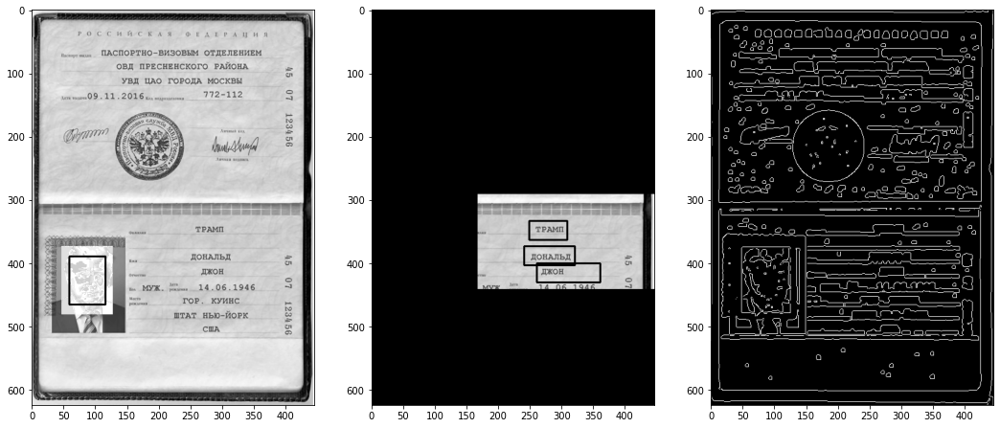

found dilate_kernel=(5, 5), er_ker=(1, 1), denoiser=billateral
0.jpeg
1/1 [==============================] - 0s 38ms/step
result:((260, 400, 100, 30)), conf: 0.80877, text: дхоя
result:((240, 373, 80, 30)), conf: 0.68346, text: довальд
result:((248, 333, 60, 30)), conf: 0.5313, text: срама


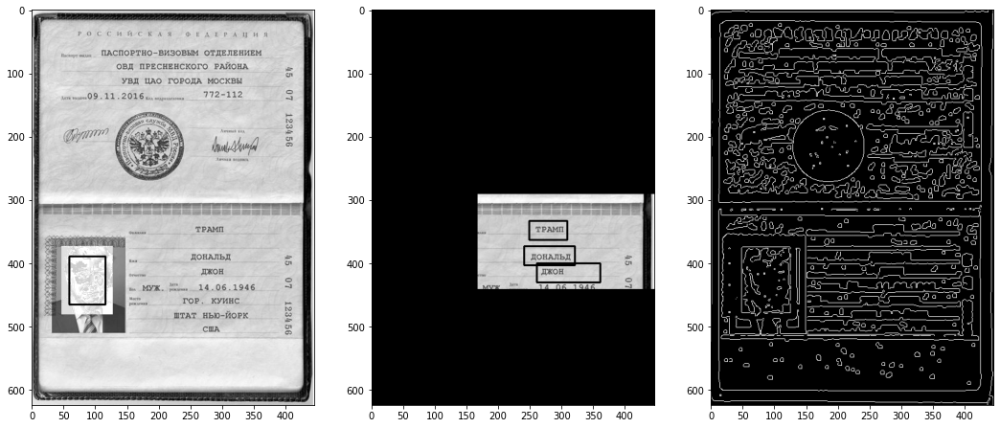

found dilate_kernel=(5, 5), er_ker=(1, 1), denoiser=None
0.jpeg
1/1 [==============================] - 0s 37ms/step
result:((260, 400, 100, 30)), conf: 0.24837, text: дзои
result:((240, 373, 80, 30)), conf: 0.39952, text: дсслльд
result:((248, 333, 60, 30)), conf: 0.48736, text: трА>е


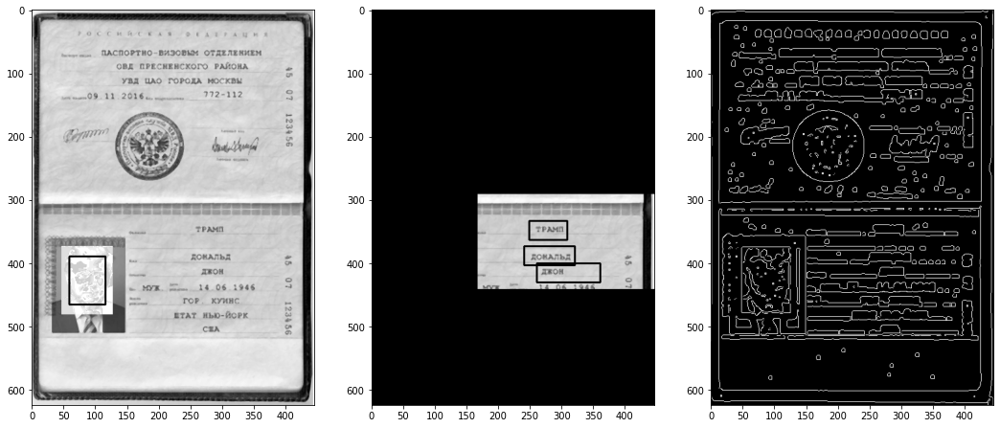

found dilate_kernel=(5, 5), er_ker=None, denoiser=custom
0.jpeg
1/1 [==============================] - 0s 36ms/step
result:((260, 400, 100, 30)), conf: 0.72588, text: дхоя
result:((240, 373, 80, 30)), conf: 0.87883, text: довальд
result:((248, 333, 60, 30)), conf: 0.35422, text: срамт


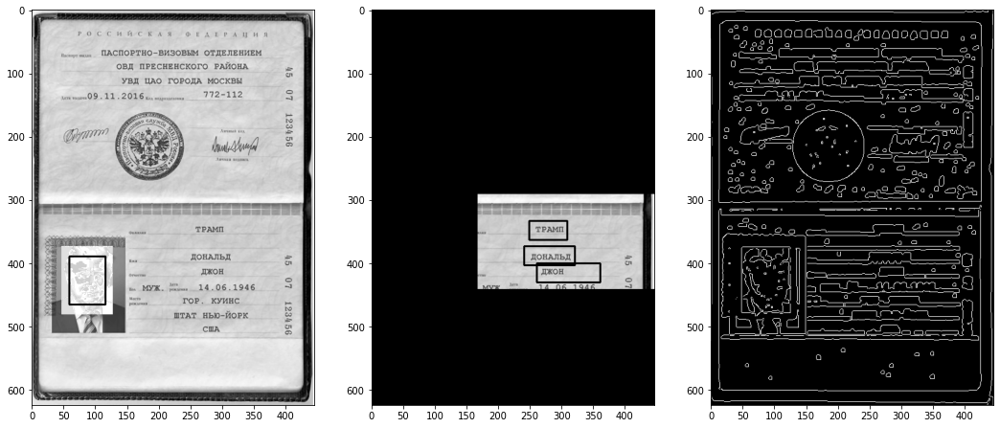

found dilate_kernel=(5, 5), er_ker=None, denoiser=billateral
0.jpeg
1/1 [==============================] - 0s 37ms/step
result:((260, 400, 100, 30)), conf: 0.80877, text: дхоя
result:((240, 373, 80, 30)), conf: 0.68346, text: довальд
result:((248, 333, 60, 30)), conf: 0.5313, text: срама


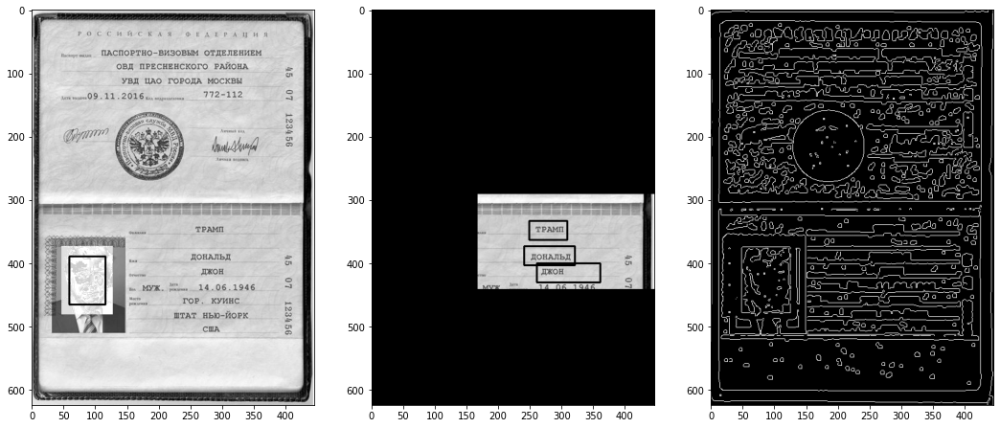

found dilate_kernel=(5, 5), er_ker=None, denoiser=None


In [ ]:
for d_ker in ((5, 5), ):
    for er_ker in ((1, 1),  None):                
        for denoiser in ('custom', 'billateral', None):

            fio_reader = PassportReader(face_detector, recognizer,
                                        temp_file=CURRENT,
                                        mask_photo=True,
                                        denoiser=denoiser,
                                        erode_kernel=er_ker,
                                        dilate_kernel=d_ker,
                                        dilate_iterations=1,
                                        show_boxes=True,
                                        clear_data=True,
                                        tr_conf=0.0,
                                        )

            for file_name in filenames:
                print(file_name)
                boxes = fio_reader.convert_image2text(file_name)
                # if len(boxes) > 0:
                print(f"found dilate_kernel={d_ker}, er_ker={er_ker}, denoiser={denoiser}")
                break

TODO
1. улучшение текст- детекции:
1.а встроенная opencv  https://github.com/opencv/opencv/blob/4.x/samples/dnn/text_detection.py
 Text detection model: https://github.com/argman/EAST
    Download link: https://www.dropbox.com/s/r2ingd0l3zt8hxs/frozen_east_text_detection.tar.gz?dl=1

1.b.  вариант - шаблоны. задать шаблон в качестве базового , захардкодить контуры относительно шаблона.

2. recognizer :
2.a аугментация фоном... т.к. бинаризация на инференсе не спасает. Сейчас модель приучена к чистому фону.
2.b. больше датасетов